# Quantitative Analysis in the Brazilian Capital Market

This notebook was developed for the paper Quantitative Analysis in the Brazilian Capital Market: Preditive Modeling for Companies Financial Indicators 

By Giovanni Maniezzo



# Plataform inicialization

A célula a seguir inicializa a plataforma, carregando as bibliotecas que serão relevantes para o trabalho em seguida.

## Bibliotecas



```numpy``` -- numeric processing.

```pandas``` -- data manipulation.

```yfinacne``` -- extract financial data.

```pyplot``` -- data visualization.

```seaborn``` -- data visualization.

```sklearn``` -- machine learning tools.


In [126]:
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.model_selection import TimeSeriesSplit
from statsmodels.graphics.tsaplots import plot_acf
from scipy.stats import skew

# Importando os dados

Previously preprocessed data.
Importing 7 index 
* IPCA
* SELIC 
* IGPM
* VIX
* INCC
* IEE
* IBOV

In [127]:
#importar csv - INDÍCES =
ipca = pd.read_csv('clean_data\\ipca.csv', sep=';')
#definir index ipca como coluna Unnamed: 0
ipca = ipca.set_index('DATA')
#transformar index em datetime
ipca.index = pd.to_datetime(ipca.index, format='%Y-%m-%d')
ipca['IPCA'] = ipca['IPCA'].astype(float)
print(ipca.head())

selic = pd.read_csv('clean_data\\selic.csv', sep=';')
selic = selic.set_index('DATA')
selic.index = pd.to_datetime(selic.index, format='%Y-%m-%d')
selic['SELIC'] = selic['SELIC'].astype(float)
print(selic.head())

igpm = pd.read_csv('clean_data\\igpm.csv', sep=';')
igpm = igpm.set_index('DATA')
igpm.index = pd.to_datetime(igpm.index, format='%Y-%m-%d')
igpm['IGPM'] = igpm['IGPM'].astype(float)
print(igpm.head())

vix_data = pd.read_csv("clean_data\\VIX.csv", header=0, sep=";")
vix = vix_data.set_index('DATE')
vix.index = pd.to_datetime(vix.index)
vix['CLOSE'] = vix['CLOSE'].astype(float)
vix = vix.rename(columns={'CLOSE': 'VIX'})
print(vix.head())

#incc
incc = pd.read_csv('clean_data\\incc.csv', sep=';', index_col=0, header=0)
incc.index = pd.to_datetime(incc.index, format='%Y-%m-%d')
incc['Valor'] = incc['Valor'].astype(float)
incc = incc.rename(columns={'Valor':'INCC'})
print(incc.head())

#IEE
iee = pd.read_csv('clean_data\\iee.csv', sep=';', index_col=0, header=0)
iee.index = pd.to_datetime(iee.index, format='%Y-%m-%d')
iee = iee.rename(columns={'Valor': 'IEE'})
print(iee.head())

#IBOV
ibov = pd.read_csv('clean_data\\ibov.csv', sep=';', index_col=0, header=0)
ibov.index = pd.to_datetime(ibov.index, format='%Y-%m-%d')
ibov = ibov.rename(columns={'Close': 'IBOV'})
print(ibov.head())


dict_indices = {'ipca': ipca, 'selic': selic, 'igpm': igpm, 'vix': vix, 'ibov': ibov, 'incc': incc, 'iee': iee}
#transformar o dict_indices em um dataframe
df_indices = pd.concat(dict_indices.values(), axis=1)

            IPCA
DATA            
2011-03-31  0.79
2011-06-30  0.15
2011-09-30  0.53
2011-12-31  0.50
2012-03-31  0.21
            SELIC
DATA             
2011-03-31  11.67
2011-06-30  12.17
2011-09-30  11.90
2011-12-31  10.90
2012-03-31   9.65
            IGPM
DATA            
2011-03-31  0.62
2011-06-30 -0.18
2011-09-30  0.65
2011-12-31 -0.12
2012-03-31  0.43
              VIX
DATE             
2011-03-31  17.74
2011-06-30  16.52
2011-09-30  42.96
2011-12-31  23.40
2012-03-31  15.50
            INCC
Data            
2011-03-31  0.43
2011-06-30  0.37
2011-09-30  0.14
2011-12-31  0.11
2012-03-31  0.51
                 IEE
Data                
2011-03-31  29892.13
2011-06-30  30073.77
2011-09-30  27810.66
2011-12-31  32613.71
2012-03-31  35281.68
               IBOV
DATE               
2011-03-31  68587.0
2011-06-30  62404.0
2011-09-30  52324.0
2011-12-31  56754.0
2012-03-31  64511.0


Importação de dados das companhias de transmissão selecionadas:
* ELET4
* TRPL4
* TAEE4
* ALUP4

In [128]:
dict_empresas = {"eletrobras": pd.read_csv('clean_data\\dados_trimestrais_completos_2437.csv', sep=';', index_col=0),
        "tpaulista": pd.read_csv('clean_data\\dados_trimestrais_completos_18376.csv', sep=';', index_col=0),
        "taesa": pd.read_csv('clean_data\\dados_trimestrais_completos_20257.csv', sep=';', index_col=0),
        "alupar": pd.read_csv('clean_data\\dados_trimestrais_completos_21490.csv', sep=';', index_col=0),
    }

for key in dict_empresas.keys():
    dict_empresas[key] = dict_empresas[key].rename(columns={'3.01':'Receita de venda', '3.02':'Custos dos bens vendidos', '3.03': 'Resultado bruto',
                                                   '3.04':'Receitas/Despesas Operacionais', '3.05':'Result antes do financeiro e imp', '3.06': 'Resultado financeiro',
                                                   '3.07':'Resultado antes dos tributos', '3.08':'Imposto de renda', '3.09':'Resultado Líquido Recorrente',
                                                   '3.10': 'Resultado Líquido Não Recorrente', '3.11': 'Lucro Prejuízo'})
    print(dict_empresas[key].pop('3.99'))


print(dict_empresas['eletrobras'].head())

DT_FIM_EXERC
2011-03-31    0.0
2011-06-30    0.0
2011-09-30    0.0
2011-12-31    0.0
2012-03-31    0.0
2012-06-30    0.0
2012-09-30    0.0
2012-12-31    0.0
2013-03-31    0.0
2013-06-30    0.0
2013-09-30    0.0
2013-12-31    0.0
2014-03-31    0.0
2014-06-30    0.0
2014-09-30    0.0
2014-12-31    0.0
2015-03-31    0.0
2015-06-30    0.0
2015-09-30    0.0
2015-12-31    0.0
2016-03-31    0.0
2016-06-30    0.0
2016-09-30    0.0
2016-12-31    0.0
2017-03-31    0.0
2017-06-30    0.0
2017-09-30    0.0
2017-12-31    0.0
2018-03-31    0.0
2018-06-30    0.0
2018-09-30    0.0
2018-12-31    0.0
2019-03-31    0.0
2019-06-30    0.0
2019-09-30    0.0
2019-12-31    0.0
2020-03-31    0.0
2020-06-30    0.0
2020-09-30    0.0
2020-12-31    0.0
2021-03-31    0.0
2021-06-30    0.0
2021-09-30    0.0
2021-12-31    0.0
2022-03-31    0.0
2022-06-30    0.0
2022-09-30    0.0
2022-12-31    0.0
2023-03-31    0.0
2023-06-30    0.0
2023-09-30    0.0
2023-12-31    0.0
2024-03-31    0.0
2024-06-30    0.0
Name: 3.99, dty

In [129]:
dict_empresas['alupar'].index

Index(['2011-03-31', '2011-09-30', '2011-12-31', '2012-03-31', '2012-06-30',
       '2012-09-30', '2012-12-31', '2013-03-31', '2013-06-30', '2013-09-30',
       '2013-12-31', '2014-03-31', '2014-06-30', '2014-09-30', '2014-12-31',
       '2015-03-31', '2015-06-30', '2015-09-30', '2015-12-31', '2016-03-31',
       '2016-06-30', '2016-09-30', '2016-12-31', '2017-03-31', '2017-06-30',
       '2017-09-30', '2017-12-31', '2018-03-31', '2018-06-30', '2018-09-30',
       '2018-12-31', '2019-03-31', '2019-06-30', '2019-09-30', '2019-12-31',
       '2020-03-31', '2020-06-30', '2020-09-30', '2020-12-31', '2021-03-31',
       '2021-06-30', '2021-09-30', '2021-12-31', '2022-03-31', '2022-06-30',
       '2022-09-30', '2022-12-31', '2023-03-31', '2023-06-30', '2023-09-30',
       '2023-12-31', '2024-03-31', '2024-06-30', '2011-06-30'],
      dtype='object', name='DT_FIM_EXERC')

In [130]:
#dict_empresas['eletrobras'] = dict_empresas['eletrobras'].drop('2024-06-30')
for key in dict_empresas.keys():
    if '2024-06-30' in dict_empresas[key].index:
        dict_empresas[key] = dict_empresas[key].drop('2024-06-30')
    print(key)
    print(len(dict_empresas[key]))

eletrobras
53
tpaulista
53
taesa
53
alupar
53


# Data stadarization

In [131]:
def standarization_time_series(serie):
    """
    Padroniza uma série temporal (z-score normalization).

    Parâmetros:
    serie (pd.Series): Série temporal a ser padronizada.

    Retorno:
    pd.Series: Série temporal padronizada.
    """
    mean = serie.mean()
    std_deviation = serie.std()
    
    standard_series = (serie - mean) / std_deviation
    print(f"Standarization completed with success - matrix shape {np.shape(standard_series)}")

    return standard_series

In [132]:
def min_max_time_series(serie):
    """
    Normaliza uma série temporal (min-max normalization).

    Parâmetros:
    serie (pd.Series): Série temporal a ser normalizada.

    Retorno:
    pd.Series: Série temporal normalizada.
    """
    min_value = serie.min()
    max_value = serie.max()
    
    normalized_series = (serie - min_value) / (max_value - min_value)
    print(f"Min-Max normalization completed with success - matrix shape {np.shape(normalized_series)}")

    return normalized_series

In [133]:
for empresa in dict_empresas.keys():
    for indicador in dict_empresas[empresa]:
        print(f"{empresa} - {indicador}")
        dict_empresas[empresa][indicador] = standarization_time_series(dict_empresas[empresa][indicador])
        #dict_empresas[empresa][indicador] = min_max_time_series(dict_empresas[empresa][indicador])	




eletrobras - Receita de venda
Standarization completed with success - matrix shape (53,)
eletrobras - Custos dos bens vendidos
Standarization completed with success - matrix shape (53,)
eletrobras - Resultado bruto
Standarization completed with success - matrix shape (53,)
eletrobras - Receitas/Despesas Operacionais
Standarization completed with success - matrix shape (53,)
eletrobras - Result antes do financeiro e imp
Standarization completed with success - matrix shape (53,)
eletrobras - Resultado financeiro
Standarization completed with success - matrix shape (53,)
eletrobras - Resultado antes dos tributos
Standarization completed with success - matrix shape (53,)
eletrobras - Imposto de renda
Standarization completed with success - matrix shape (53,)
eletrobras - Resultado Líquido Recorrente
Standarization completed with success - matrix shape (53,)
eletrobras - Resultado Líquido Não Recorrente
Standarization completed with success - matrix shape (53,)
eletrobras - Lucro Prejuízo
S

In [134]:
for indice in df_indices.columns:
    print(f'{indice}')
    df_indices[indice] = standarization_time_series(df_indices[indice])

IPCA
Standarization completed with success - matrix shape (53,)
SELIC
Standarization completed with success - matrix shape (53,)
IGPM
Standarization completed with success - matrix shape (53,)
VIX
Standarization completed with success - matrix shape (53,)
IBOV
Standarization completed with success - matrix shape (53,)
INCC
Standarization completed with success - matrix shape (53,)
IEE
Standarization completed with success - matrix shape (53,)


# Data exploratory

Index data info

In [135]:
print(f"{indicador} - Info")
print(df_indices.info())
print(100*'=')
print(f"{indicador} - Describe")
print(df_indices.describe())

#categ = df_indices.dtype[df_indices.dtype == 'object'].index
#df_indices[categ].describe()

Lucro Prejuízo - Info
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 53 entries, 2011-03-31 to 2024-03-31
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   IPCA    53 non-null     float64
 1   SELIC   53 non-null     float64
 2   IGPM    53 non-null     float64
 3   VIX     53 non-null     float64
 4   IBOV    53 non-null     float64
 5   INCC    53 non-null     float64
 6   IEE     53 non-null     float64
dtypes: float64(7)
memory usage: 3.3 KB
None
Lucro Prejuízo - Describe
               IPCA         SELIC          IGPM           VIX          IBOV  \
count  5.300000e+01  5.300000e+01  5.300000e+01  5.300000e+01  5.300000e+01   
mean  -2.094760e-18  5.121689e-16  4.608473e-17 -2.094760e-16  1.424437e-16   
std    1.000000e+00  1.000000e+00  1.000000e+00  1.000000e+00  1.000000e+00   
min   -1.939037e+00 -2.033923e+00 -2.600191e+00 -1.162442e+00 -1.312729e+00   
25%   -7.384649e-01 -8.183703e-01 -4.590022e-01 -6.142832

Companies indicators data info

In [136]:
for empresa in dict_empresas.keys():
    print(f'{empresa} - INFO')
    print(dict_empresas[empresa].info())
    print(100*'=')
    print(f'{empresa} - DESCRIBE')
    print(dict_empresas[empresa].describe())
    print(100*'*')
    print(100*'*')

eletrobras - INFO
<class 'pandas.core.frame.DataFrame'>
Index: 53 entries, 2011-03-31 to 2024-03-31
Data columns (total 11 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Receita de venda                  53 non-null     float64
 1   Custos dos bens vendidos          53 non-null     float64
 2   Resultado bruto                   53 non-null     float64
 3   Receitas/Despesas Operacionais    53 non-null     float64
 4   Result antes do financeiro e imp  53 non-null     float64
 5   Resultado financeiro              53 non-null     float64
 6   Resultado antes dos tributos      53 non-null     float64
 7   Imposto de renda                  53 non-null     float64
 8   Resultado Líquido Recorrente      53 non-null     float64
 9   Resultado Líquido Não Recorrente  53 non-null     float64
 10  Lucro Prejuízo                    53 non-null     float64
dtypes: float64(11)
memory usage: 5.0+ KB
None
e

Adjusting NaN values - ajustar de posição no código

In [137]:
for empresa in dict_empresas.keys():
     dict_empresas[empresa] = dict_empresas[empresa].fillna(0)
     print(f"{empresa} - {np.shape(dict_empresas[empresa].info())}")

<class 'pandas.core.frame.DataFrame'>
Index: 53 entries, 2011-03-31 to 2024-03-31
Data columns (total 11 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Receita de venda                  53 non-null     float64
 1   Custos dos bens vendidos          53 non-null     float64
 2   Resultado bruto                   53 non-null     float64
 3   Receitas/Despesas Operacionais    53 non-null     float64
 4   Result antes do financeiro e imp  53 non-null     float64
 5   Resultado financeiro              53 non-null     float64
 6   Resultado antes dos tributos      53 non-null     float64
 7   Imposto de renda                  53 non-null     float64
 8   Resultado Líquido Recorrente      53 non-null     float64
 9   Resultado Líquido Não Recorrente  53 non-null     float64
 10  Lucro Prejuízo                    53 non-null     float64
dtypes: float64(11)
memory usage: 5.0+ KB
eletrobras - ()
<class '

Scatter plot

C:\Users\giova\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\pandas\plotting\_matplotlib\misc.py:100: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(boundaries_list[j])
C:\Users\giova\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\pandas\plotting\_matplotlib\misc.py:101: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(boundaries_list[i])
C:\Users\giova\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\pandas\plotting\_matplotlib\misc.py:91: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(boundaries_list[i])


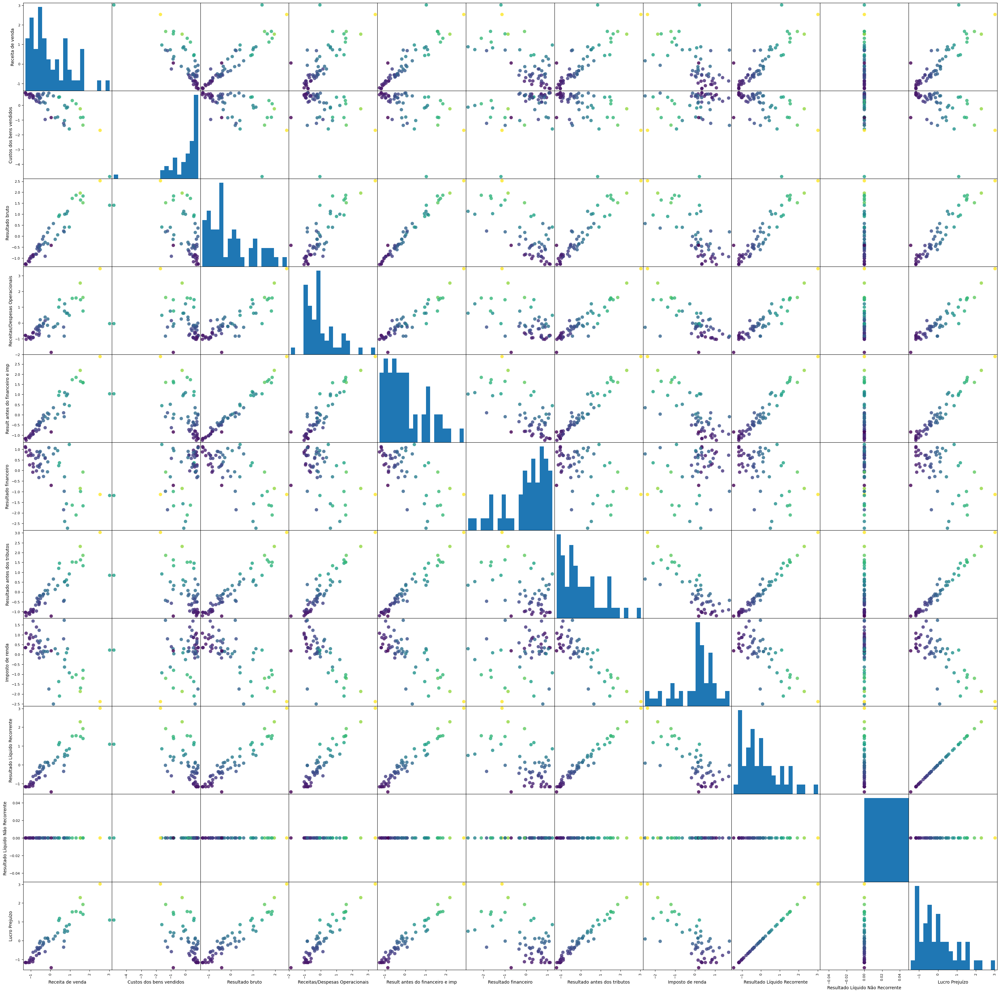

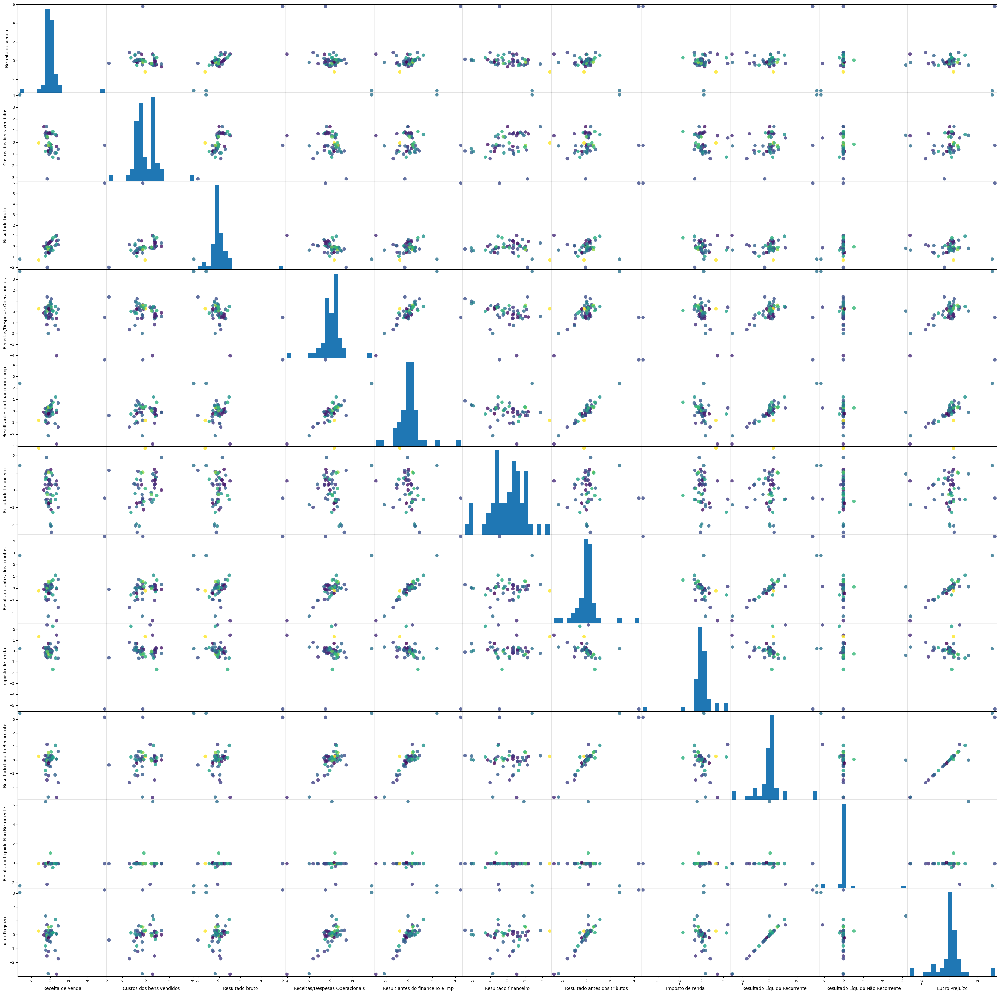

In [138]:
y = dict_empresas['taesa']["Lucro Prejuízo"]
ax1 = pd.plotting.scatter_matrix(dict_empresas['taesa'], alpha=0.8, figsize=(40, 40), marker='o',  hist_kwds={'bins': 20}, s=60, c=y)
ax2 = pd.plotting.scatter_matrix(dict_empresas['eletrobras'], alpha=0.8, figsize=(40, 40), marker='o',  hist_kwds={'bins': 20}, s=60, c=y)

# Correlation matrix

Indicators

Correlation matrix with RECEITA DE VENDA
eletrobras - Receita de venda
Lucro Prejuízo                      1.000000
Resultado Líquido Recorrente        0.977864
Resultado antes dos tributos        0.950763
Result antes do financeiro e imp    0.915206
Receitas/Despesas Operacionais      0.699734
Custos dos bens vendidos            0.343238
Resultado bruto                     0.336074
Receita de venda                    0.142897
Resultado financeiro                0.109439
Resultado Líquido Não Recorrente    0.005974
Imposto de renda                   -0.456152
Name: Lucro Prejuízo, dtype: float64
eletrobras - Custos dos bens vendidos
Lucro Prejuízo                      1.000000
Resultado Líquido Recorrente        0.977864
Resultado antes dos tributos        0.950763
Result antes do financeiro e imp    0.915206
Receitas/Despesas Operacionais      0.699734
Custos dos bens vendidos            0.343238
Resultado bruto                     0.336074
Receita de venda                    0.142897

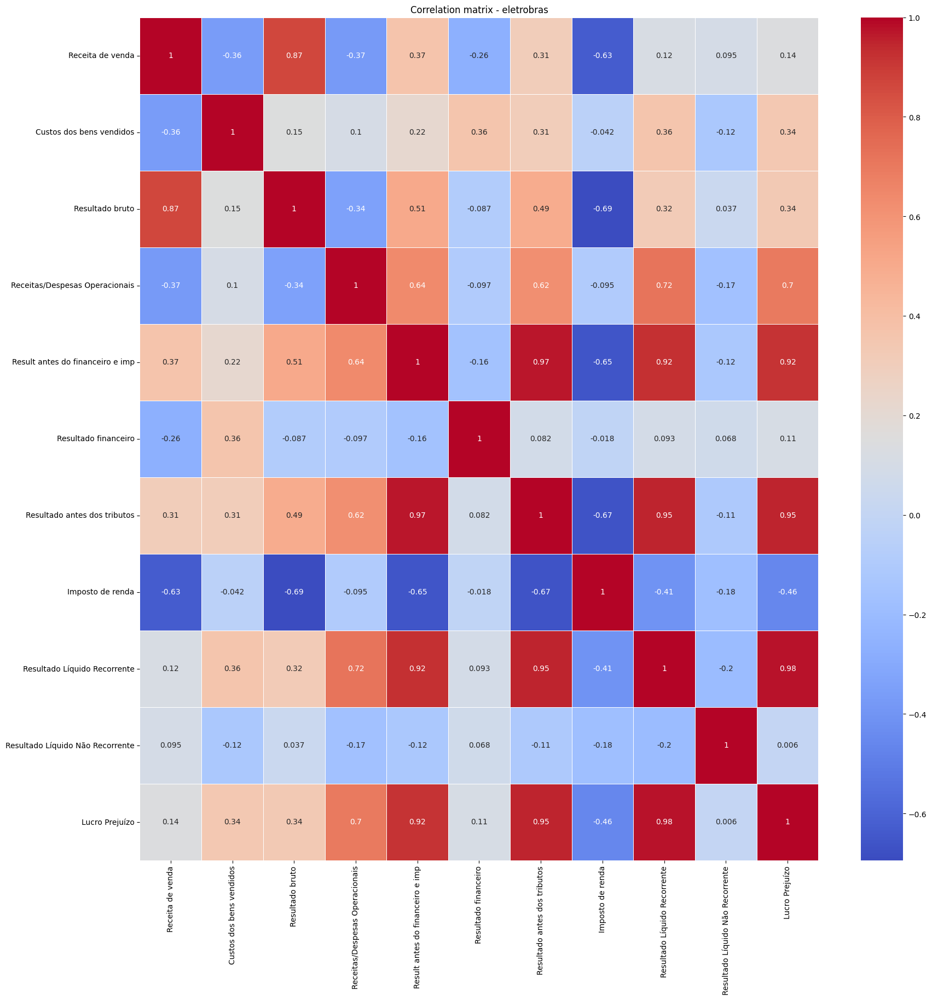

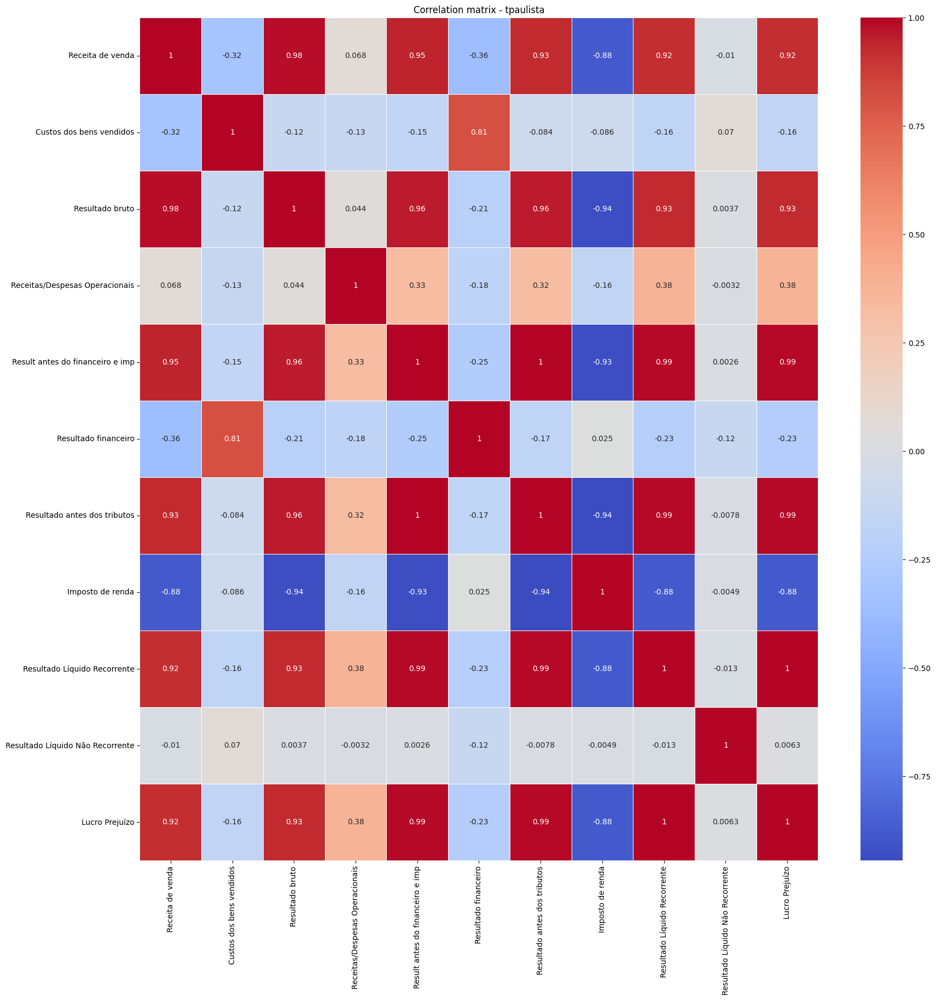

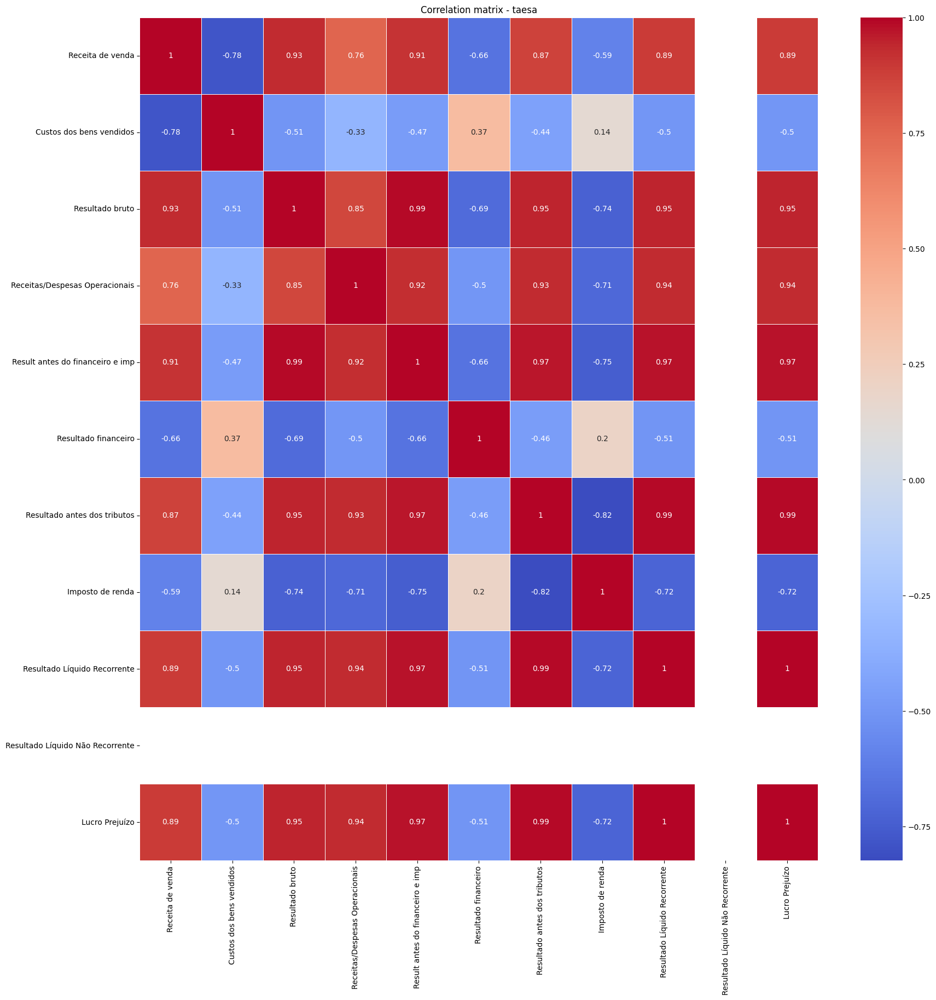

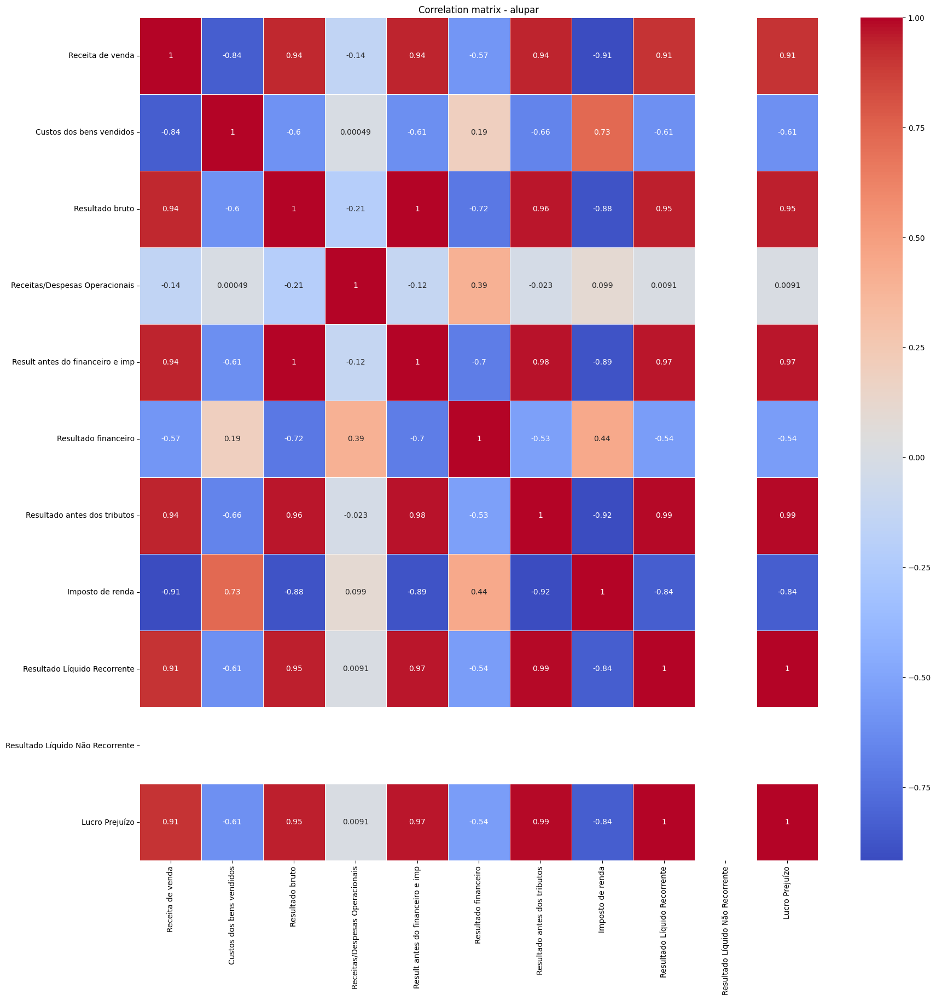

In [139]:
print(f"Correlation matrix with RECEITA DE VENDA")
for empresa in dict_empresas.keys():
    #generete a correlation matrix
    for indicador in dict_empresas[empresa].columns:
        corr = dict_empresas[empresa].corr()
        print(f"{empresa} - {indicador}")
        print(corr['Lucro Prejuízo'].sort_values(ascending=False))

    #plot the heatmap
    plt.figure(figsize=(20, 20))
    plt.title(f"Correlation matrix - {empresa}")
    sns.heatmap(corr, annot=True, cmap='coolwarm', linewidths=0.5, )

Indexes

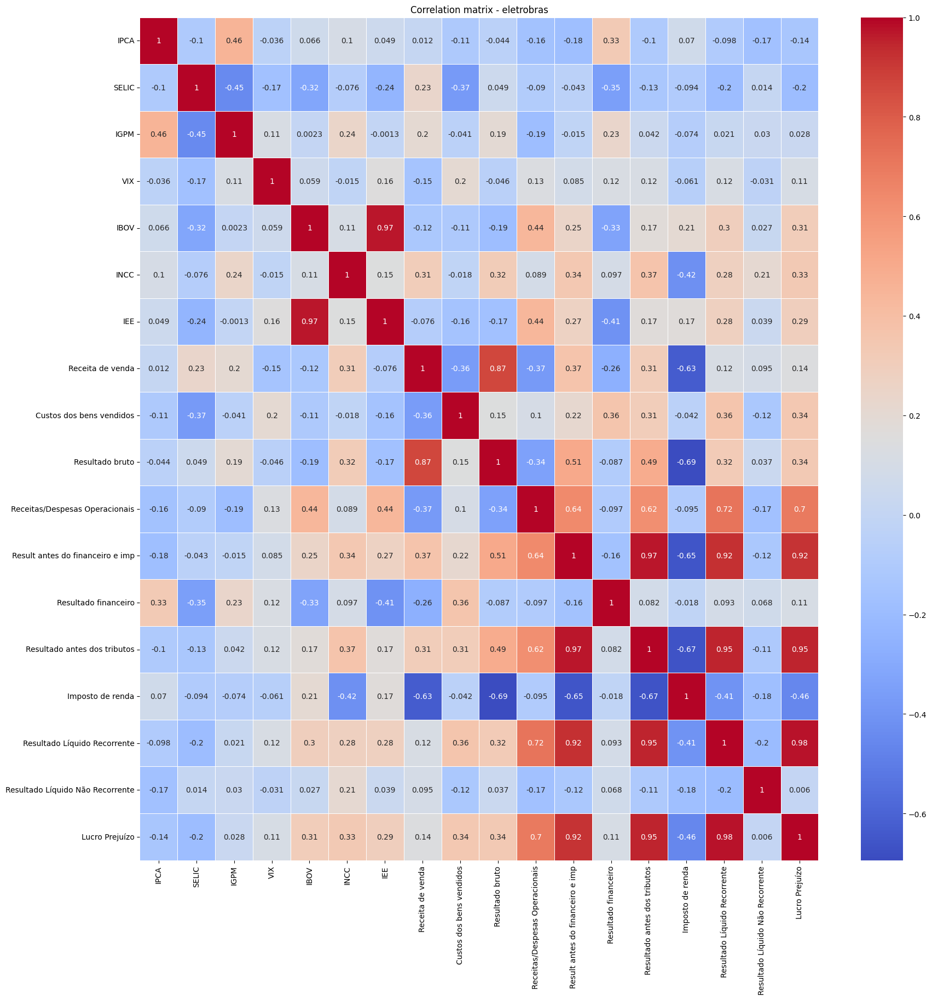

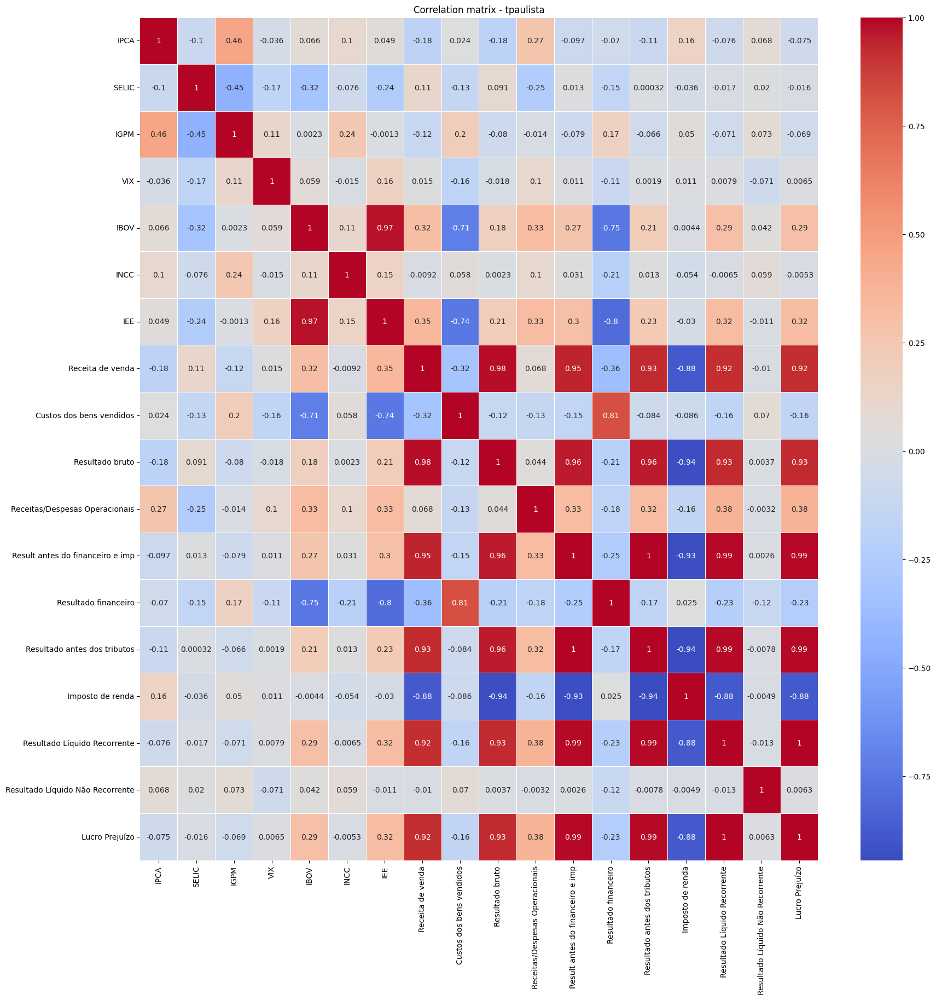

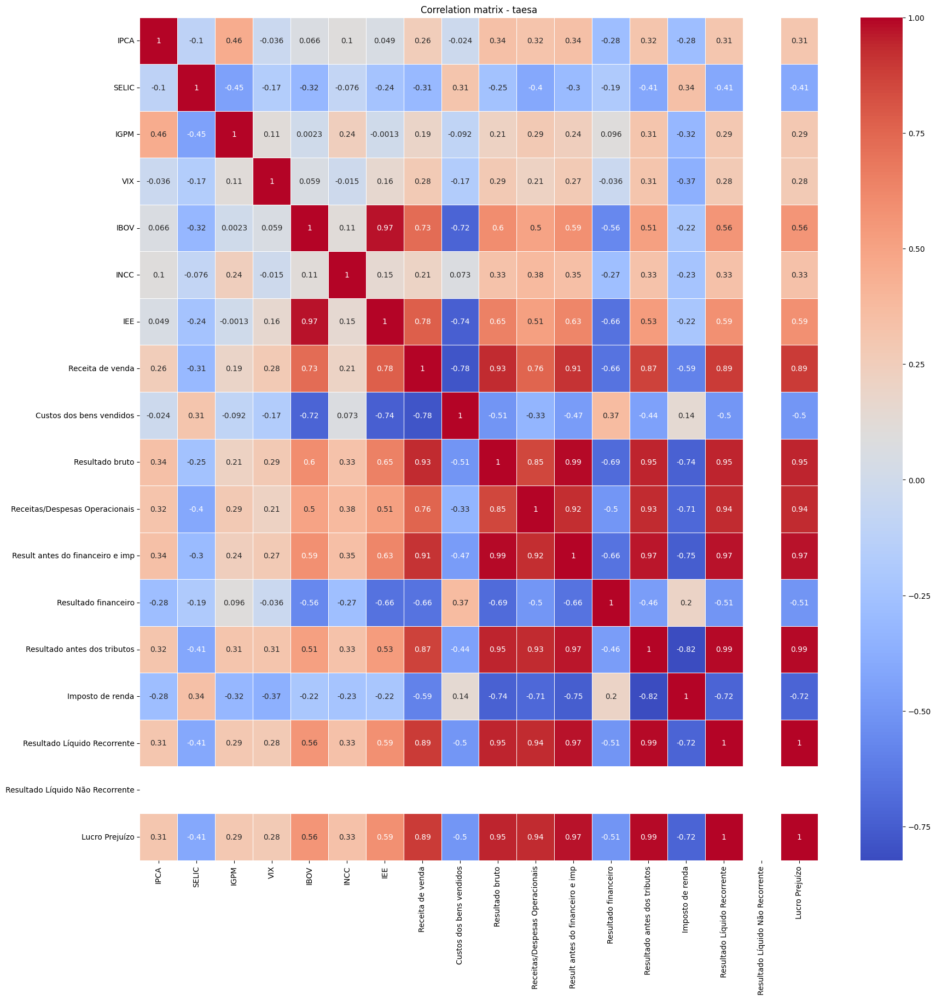

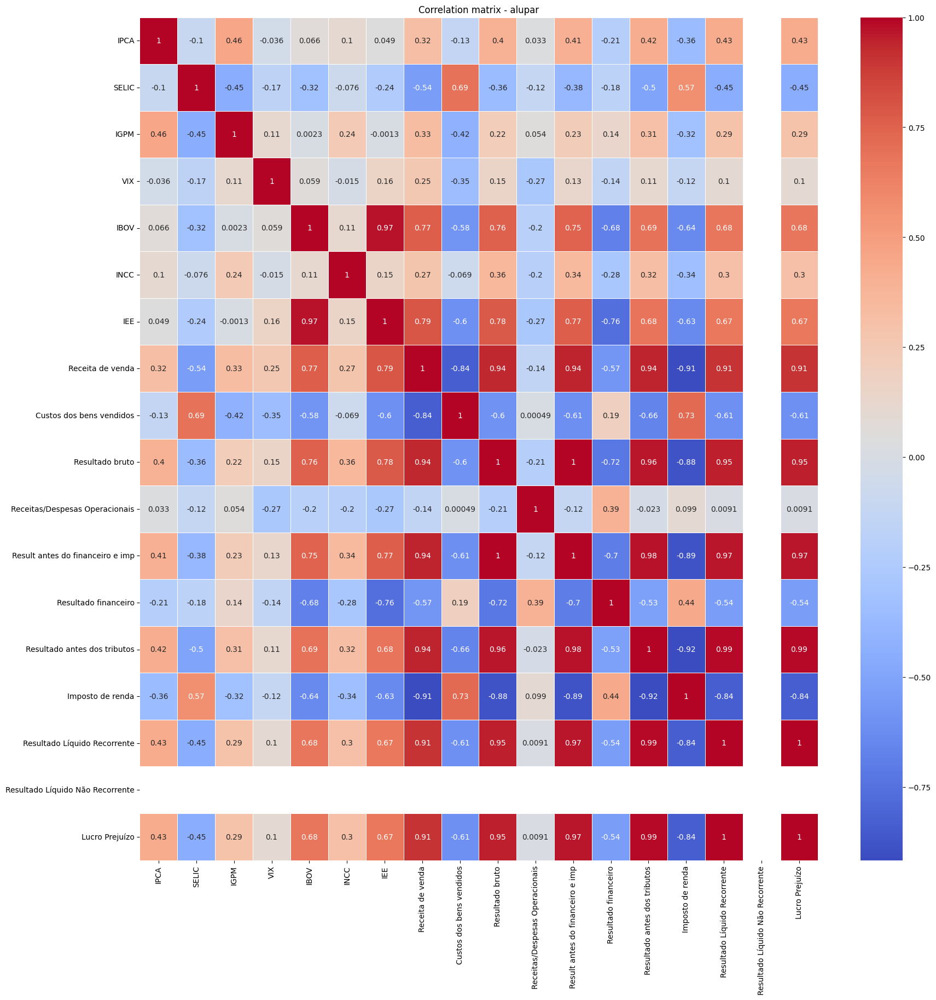

In [140]:
for empresa in dict_empresas.keys():
    # Set the index as datetime to equal the indices dataframe to the combined dataframe
    dict_empresas[empresa].index = pd.to_datetime(dict_empresas[empresa].index)
    combined_df = df_indices.copy()

    for col in dict_empresas[empresa].columns:	
        combined_df[col] = pd.Series(dict_empresas[empresa][col], index=combined_df.index)
    
    # Calculate the correlation matrix
    correlation_matrix = combined_df.corr()
    
    # Plot the heatmap
    plt.figure(figsize=(20, 20))
    plt.title(f"Correlation matrix - {empresa}")
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
    plt.show()
    
    #backing the index to the original format
    dict_empresas[empresa].index = dict_empresas[empresa].index.astype(str)


# Método para gerar lag
* Número de 4 lags (1 ano)
* Referente a índices e indicadores

In [141]:
def creating_lag_matrix(time_series, lag):
    n = len(time_series)
    time_series_lagged = np.zeros((n-lag, lag))
    for i in range(lag, n):
        time_series_lagged[i-lag] = time_series[i-lag:i]

    print(f'Matrix {np.shape(time_series_lagged)} created with success')
    return time_series_lagged

In [142]:
# Criando matrizes com lags para cada indicador de empresas
dict_empresas_lagged = {}
for empresa in dict_empresas.keys():
    # Inicializando o dicionário para a empresa, caso ainda não exista
    if empresa not in dict_empresas_lagged:
        dict_empresas_lagged[empresa] = {}

    for indicador in dict_empresas[empresa].columns:
        time_series = dict_empresas[empresa][indicador].values

        # cria uma matriz de tamanho nx4
        print(f'Creating lagged indicator matrix - {empresa} - {indicador}')
        dict_empresas_lagged[empresa][indicador] = creating_lag_matrix(time_series, 4)


Creating lagged indicator matrix - eletrobras - Receita de venda
Matrix (49, 4) created with success
Creating lagged indicator matrix - eletrobras - Custos dos bens vendidos
Matrix (49, 4) created with success
Creating lagged indicator matrix - eletrobras - Resultado bruto
Matrix (49, 4) created with success
Creating lagged indicator matrix - eletrobras - Receitas/Despesas Operacionais
Matrix (49, 4) created with success
Creating lagged indicator matrix - eletrobras - Result antes do financeiro e imp
Matrix (49, 4) created with success
Creating lagged indicator matrix - eletrobras - Resultado financeiro
Matrix (49, 4) created with success
Creating lagged indicator matrix - eletrobras - Resultado antes dos tributos
Matrix (49, 4) created with success
Creating lagged indicator matrix - eletrobras - Imposto de renda
Matrix (49, 4) created with success
Creating lagged indicator matrix - eletrobras - Resultado Líquido Recorrente
Matrix (49, 4) created with success
Creating lagged indicator 

In [143]:
# Criando matrizes de lags para os índices macro econômicos
dict_indices_lagged = {}
for indice in df_indices.columns:
    time_series = df_indices[indice].values
    #cria uma matriz de tamanho nx4
    print(f'Creating lagged index matrix - {indice}')
    dict_indices_lagged[indice] = creating_lag_matrix(time_series, 4)

Creating lagged index matrix - IPCA
Matrix (49, 4) created with success
Creating lagged index matrix - SELIC
Matrix (49, 4) created with success
Creating lagged index matrix - IGPM
Matrix (49, 4) created with success
Creating lagged index matrix - VIX
Matrix (49, 4) created with success
Creating lagged index matrix - IBOV
Matrix (49, 4) created with success
Creating lagged index matrix - INCC
Matrix (49, 4) created with success
Creating lagged index matrix - IEE
Matrix (49, 4) created with success


Building PSI matrix - Least Square Method - concatenating the lags with the original matrix

In [144]:
psi_empresas = {}
for empresa in dict_empresas_lagged.keys():
    psi_empresas[empresa] = np.concatenate(list(dict_empresas_lagged[empresa].values()), axis=1)
    for indice in dict_indices_lagged.keys():
        #print(f"{empresa} - psi shape: {np.shape(psi_empresas[empresa])}")
        psi_empresas[empresa] = np.concatenate((psi_empresas[empresa], dict_indices_lagged[indice]), axis=1)
    
print(f"Matrix psi shape: {np.shape(psi_empresas['eletrobras'])}")

Matrix psi shape: (49, 72)


## ARX MODEL - BATCH

TRAINING AND TESTING

Empresa eletrobras - tamanho treino 39
Empresa eletrobras - tamanho validação 10
eletrobras - training MSE: 3.307248937626509e-29
eletrobras - test MSE: 14.88984039659926
Empresa tpaulista - tamanho treino 39
Empresa tpaulista - tamanho validação 10
tpaulista - training MSE: 2.842542968015457e-29
tpaulista - test MSE: 47.41854017169416
Empresa taesa - tamanho treino 39
Empresa taesa - tamanho validação 10
taesa - training MSE: 3.614289022711443e-30
taesa - test MSE: 1.468510404369993
Empresa alupar - tamanho treino 39
Empresa alupar - tamanho validação 10
alupar - training MSE: 2.6564164068220617e-29
alupar - test MSE: 4.755752518175633


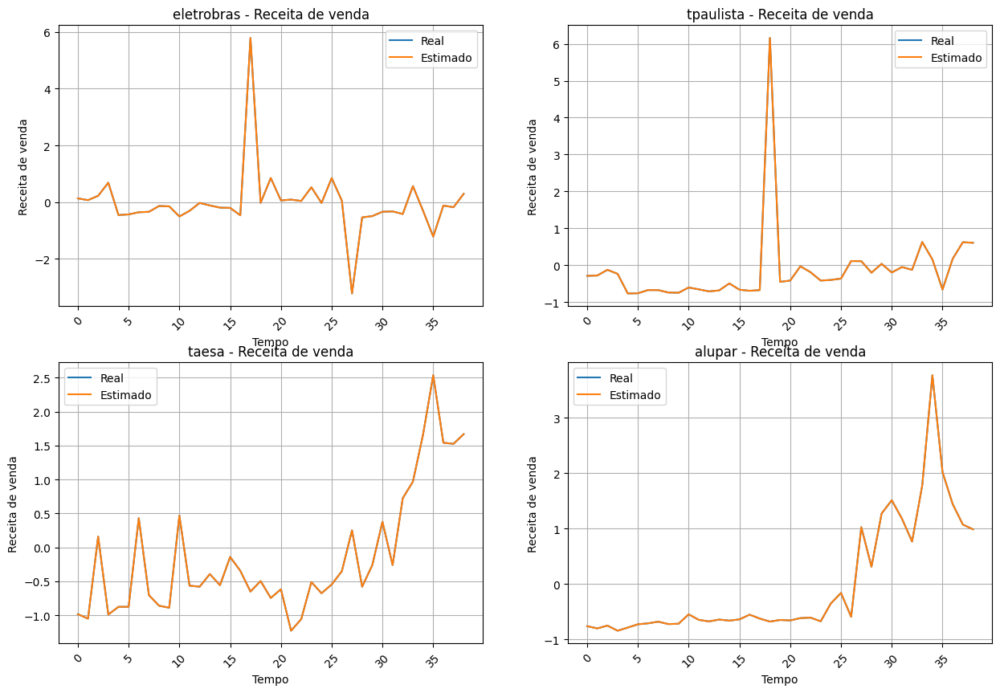

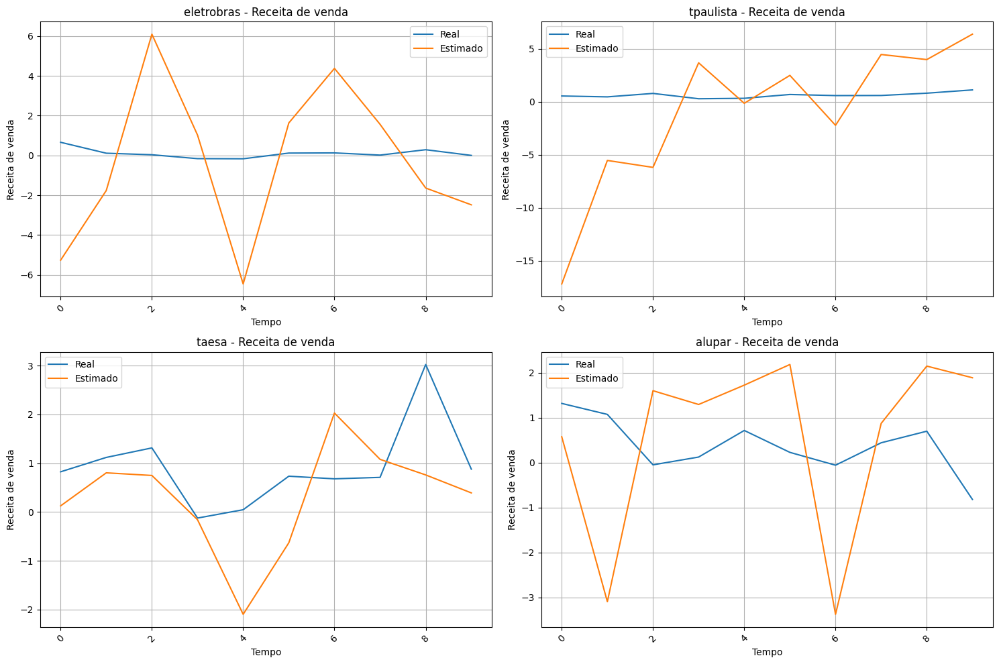

In [257]:
#n_splits = 2
#tscv = TimeSeriesSplit(n_splits=n_splits)
#fig, axs = plt.subplots(2, 2, figsize=(60, 20))


#Optando por fazer divisão na mão devido a uma inconsistência no TimeSeriesSplit:
#Tamanho total: 49
#Empresa eletrobras - tamanho treino 17
#Empresa eletrobras - tamanho validação 17

theta_arx = {}
y_estimate_arx = {}	
train_proportion = 0.8
fig, axs = plt.subplots(2, 2, figsize=(15, 10))
fig2, axs2 = plt.subplots(2, 2, figsize=(15, 10))
for i,empresa in enumerate(psi_empresas.keys()):
    X = psi_empresas[empresa]
    y = np.array(dict_empresas[empresa]['Receita de venda'][4:])

    #train and test proportion 0.8 and 0.2

    train_size = int(len(X) * train_proportion)
    val_index = int(len(X) * (1-train_proportion))

    X_train, X_val = X[:train_size], X[train_size:]
    y_train, y_val = y[:train_size], y[train_size:]
    print(f"Empresa {empresa} - tamanho treino {len(X_train)}")
    print(f"Empresa {empresa} - tamanho validação {len(X_val)}")

    # Criar subplots fora do loop
    #print(f"{empresa} - {np.shape(psi)}")
    psi_pseudo_inv = np.linalg.pinv(X_train)
    theta_arx[empresa] = np.dot(psi_pseudo_inv, y_train)
    y_estimate_arx[empresa] = np.dot(X_train, theta_arx[empresa])
    #print(f"{empresa} - Theta = {np.shape(theta)}")
    mse = np.mean((y_train - y_estimate_arx[empresa])**2)
    print(f'{empresa} - training MSE: {mse}')

    ax = axs[i // 2, i % 2]  # Selecionar o subplot correspondente
    ax.set_title(f'{empresa} - Receita de venda')
    ax.set_xlabel('Tempo')
    ax.set_ylabel('Receita de venda')
    ax.plot(y_train, label='Real')
    ax.plot(y_estimate_arx[empresa], label='Estimado')
    ax.legend()
    ax.grid()
    ax.tick_params(axis='x', rotation=45)


    #############################TESTING###################################################################
    y_estimate_arx[empresa] = np.dot(X_val, theta_arx[empresa])
    mse = np.mean((y_val - y_estimate_arx[empresa])**2)
    print(f'{empresa} - test MSE: {mse}')

    ax2 = axs2[i // 2, i % 2]  # Selecionar o subplot correspondente
    ax2.set_title(f'{empresa} - Receita de venda')
    ax2.set_xlabel('Tempo')
    ax2.set_ylabel('Receita de venda')
    ax2.plot(y_val, label='Real')
    ax2.plot(y_estimate_arx[empresa], label='Estimado')
    ax2.legend()
    ax2.grid()
    ax2.tick_params(axis='x', rotation=45)
        
plt.tight_layout()
plt.show()



Free run simulation

In [258]:
def free_run_simulation_arx(theta, psi_initial, steps, num_lags, exogenous_vars):
    """
    Free-run simulation for ARX model with exogenous variables and multiple lags.

    Parameters:
    - theta: The pre-existing ARX parameters (first num_lags parameters for y, then for exogenous inputs).
    - psi_initial: The initial regressor (past values of y and exogenous variables).
    - steps: Number of simulation steps to perform.
    - num_lags: Number of lags for the ARX model.
    - exogenous_vars: The fixed exogenous variables over time (remain constant during the free-run simulation).

    Returns:
    - y_estimation: The predicted output values for each step.
    """
    psi_free_run = np.array(psi_initial)  # Convert psi_initial to a numpy array
    y_estimation = []            # List to store the predicted y values

    # Extract the current autoregressive part (only get the first num_lags columns)

    current_psi = psi_free_run[:1, :]
    print(f"current_psi={np.shape(current_psi)}")
    y_hat = sum(np.dot(current_psi, theta))  # Linear combination of theta and psi
    print(f"y_hat={np.shape(y_hat)}")

    # Append the estimated value to the list
    y_estimation.append(y_hat)
    print(y_estimation)

    psi_ar_part = psi_free_run[:, :num_lags]

    # Loop for the number of simulation steps
    for t in range(steps):
        print(t)
        
        if t == 0:
            continue
        
        print(f"{empresa} - Start Step {t+1} ********************************************")
        #Updating the autoregressive part whith the new estimated value
        psi_lag_4 = np.insert(psi_ar_part[:,0], 1, psi_ar_part[:,1].copy()[-1], axis=0)
        psi_lag_3 = np.insert(psi_ar_part[:,1], 1, psi_ar_part[:,2].copy()[-1], axis=0)
        psi_lag_2 = np.insert(psi_ar_part[:,2], 1, psi_ar_part[:,3].copy()[-1], axis=0)
        psi_lag_1 = np.insert(psi_ar_part[:,3], 1, y_estimation[-1])
        print(f"psi_lag shape = {np.shape(psi_lag_1)}")

         # Transformar os arrays em colunas de uma matriz
        psi_ar_part = np.column_stack((psi_lag_4, psi_lag_3, psi_lag_2, psi_lag_1))

        # Combine the autoregressive part with the fixed exogenous variables
        current_psi = np.column_stack((psi_ar_part, exogenous_vars[:t+1]))
        print(f"current_psi={np.shape(current_psi)}")
        
        # Estimate y using the current psi and theta
        y_estimation = np.dot(current_psi, theta)  # Linear combination of theta and psi
        print(10*'*')
        print(f"Estimation shape={np.shape(y_estimation)}")

        # Update psi: Shift the autoregressive part and append the new y_hat
        print(f"Current psi {np.shape(current_psi)}")
        print(f"End Step {t+1} - y_hat: {y_estimation[-1]}")
    

    return np.array(y_estimation)


In [259]:
#Function implementation
y_simulation_arx = {}
for empresa in psi_empresas.keys():
    X = psi_empresas[empresa]
    y = np.array(dict_empresas[empresa]['Receita de venda'][4:])
    #train_size = int(len(X) * train_proportion)
    #val_index = int(len(X) * (1-train_proportion))
    #X_train, X_val = X[:train_size], X[train_size:]
    #y_train, y_val = y[:train_size], y[train_size:]
    
    #The train/test proportion was removed from here beacause of the confidence interval, which is
    #inversely proportional to the number of samples, and with just the test set, we can't conclude
    #if there is any statistical significance in the results.
    num_lags = 4                                          # 4 lags in the model
    psi_initial = psi_empresas[empresa][:1]                               # Initial regressor (first row of psi matrix)
    exogenous_vars = psi_empresas[empresa][:, 4:]                         # Exogenous variables (remain constant) 
    print(exogenous_vars.shape)                           # Exogenous variables remain constant
    steps = len(psi_empresas[empresa]) - 1         # Number of steps for simulation
                    
    # Perform the free-run simulation
    y_simulation_arx[empresa] = free_run_simulation_arx(theta_arx[empresa], psi_initial, steps, num_lags, exogenous_vars)

(49, 68)
current_psi=(1, 72)
y_hat=()
[0.13324805160201436]
0
1
eletrobras - Start Step 2 ********************************************
psi_lag shape = (2,)
current_psi=(2, 72)
**********
Estimation shape=(2,)
Current psi (2, 72)
End Step 2 - y_hat: 0.07193160411115973
2
eletrobras - Start Step 3 ********************************************
psi_lag shape = (3,)
current_psi=(3, 72)
**********
Estimation shape=(3,)
Current psi (3, 72)
End Step 3 - y_hat: 0.8892361936586792
3
eletrobras - Start Step 4 ********************************************
psi_lag shape = (4,)
current_psi=(4, 72)
**********
Estimation shape=(4,)
Current psi (4, 72)
End Step 4 - y_hat: 1.095166785467584
4
eletrobras - Start Step 5 ********************************************
psi_lag shape = (5,)
current_psi=(5, 72)
**********
Estimation shape=(5,)
Current psi (5, 72)
End Step 5 - y_hat: 0.10107077915048901
5
eletrobras - Start Step 6 ********************************************
psi_lag shape = (6,)
current_psi=(6, 72)

************** Company: eletrobras **************
MSE Free Run 4.715015176840745
RMSE Free Run 2.171408569763126
************** Company: tpaulista **************
MSE Free Run 9.780875664574053
RMSE Free Run 3.127439154415966
************** Company: taesa **************
MSE Free Run 0.42093039357406514
RMSE Free Run 0.6487914869771837
************** Company: alupar **************
MSE Free Run 0.8796570058634646
RMSE Free Run 0.9379003176582598


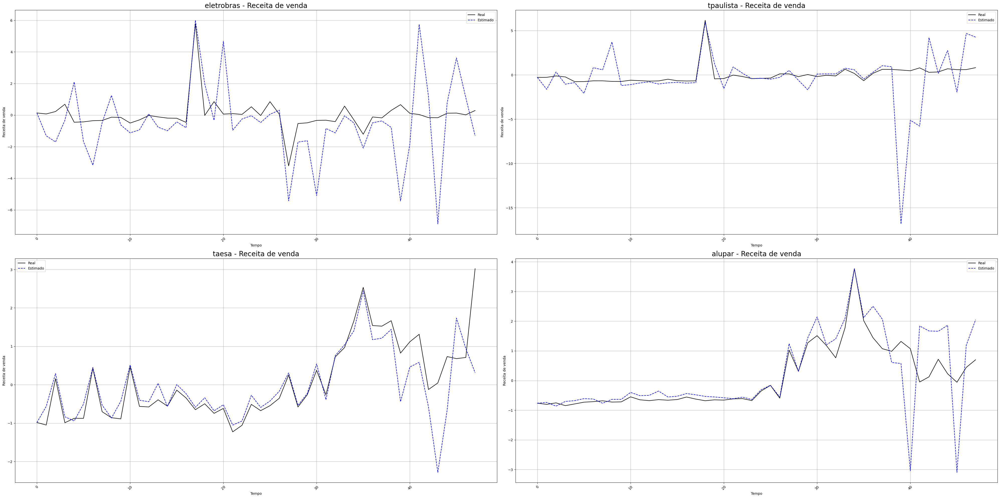

In [260]:
def plot_company_sales(psi_empresas, dict_empresas, y_simulation_arx):
    fig, axs = plt.subplots(2, 2, figsize=(40, 20))
    
    for i, empresa in enumerate(psi_empresas.keys()):
        y = np.array(dict_empresas[empresa]['Receita de venda'][4:])
        #y_val = y[train_size:]
        
        mse_free_run = np.mean((y[:-1] - y_simulation_arx[empresa])**2)
        rmse_free_run = np.sqrt(mse_free_run)
        print(f"************** Company: {empresa} **************")
        print(f"MSE Free Run {mse_free_run}")
        print(f"RMSE Free Run {rmse_free_run}")
        
        ax = axs[i // 2, i % 2]  # Selecionar o subplot correspondente
        ax.set_title(f'{empresa} - Receita de venda', fontsize=20)
        ax.set_xlabel('Tempo')
        ax.set_ylabel('Receita de venda')
        ax.plot(y[:-1], label='Real', color='black')
        ax.plot(y_simulation_arx[empresa], label='Estimado', linestyle='--', color='blue')
        ax.legend()
        ax.grid()
        ax.tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()

plot_company_sales(psi_empresas, dict_empresas, y_simulation_arx)

Ploting residual

************** Company: eletrobras **************
Residual mean =  0.48527417507890624
Residual variance =  6.898800679023363
Residual skewness =  -0.02227689093538171
************** Company: tpaulista **************
Residual mean =  0.3571702854405559
Residual variance =  11.440346089951822
Residual skewness =  2.6257382627971957
************** Company: taesa **************
Residual mean =  0.1467508360668114
Residual variance =  0.7187725289417871
Residual skewness =  0.8390346261636012
************** Company: alupar **************
Residual mean =  -0.13116209735132134
Residual variance =  1.150378647081556
Residual skewness =  0.8689313418322555


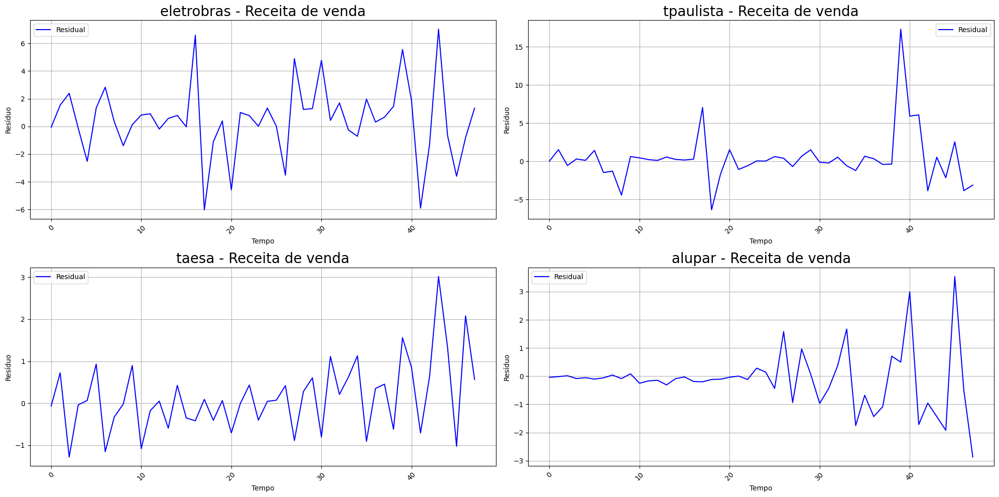

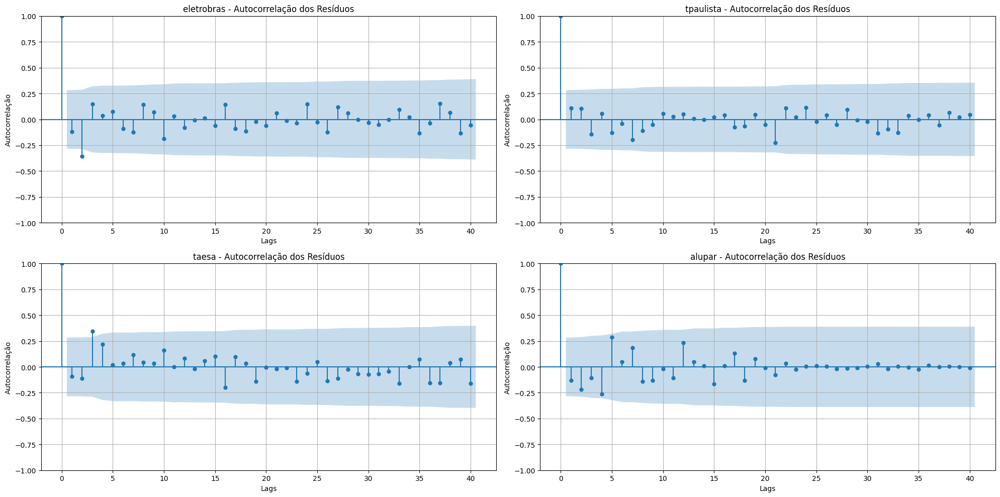

In [252]:
def ploting_residual(y_simulation, dict_empresas):

    #y_val = y[train_size:]
    #Analysing the residual curve and autocorrelation
    # for empresa in psi_empresas.keys():
        
    #     print(f"************** Company: {empresa} **************")

    #     plt.figure(figsize=(10, 5))
    #     plt.plot(residual_arx[empresa], label='Residual')
    #     plt.title(f'{empresa} - Simulação de Execução Livre')
    #     plt.xlabel('Tempo')
    #     plt.ylabel('Receita de venda')
    #     plt.legend()
    #     plt.grid()
    #     plt.show()

    residual = {}
    fig, axs = plt.subplots(2, 2, figsize=(20, 10))
    for i, empresa in enumerate(psi_empresas.keys()):

        
        y = np.array(dict_empresas[empresa]['Receita de venda'][4:])
        
        residual[empresa] = y[1:] - y_simulation[empresa]

        print(f"************** Company: {empresa} **************")	
        print("Residual mean = ", np.mean(residual[empresa]))
        print("Residual variance = ", np.var(residual[empresa]))
        print("Residual skewness = ", skew(residual[empresa]))

        
        ax = axs[i // 2, i % 2]  # Selecionar o subplot correspondente
        ax.set_title(f'{empresa} - Receita de venda', fontsize=20)
        ax.set_xlabel('Tempo')
        ax.set_ylabel('Resíduo')
        ax.plot(residual[empresa], label='Residual', color='blue')
        ax.legend()
        ax.grid()
        ax.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()
        

        # ax = axs[i // 2, i % 2]  # Selecionar o subplot correspondente
        # ax.set_title(f'{empresa} - Receita de venda', fontsize=20)
        # ax.set_xlabel('Tempo')
        # ax.set_ylabel('Receita de venda')
        # ax.plot(dict_empresas[empresa]['Receita de venda'][inicio_output:], label='Real', color='black')
        # ax.plot(y_simulation_arx[empresa], label='Estimado', linestyle='--', color='blue')
        # ax.legend()
        # ax.grid()
        # ax.tick_params(axis='x', rotation=45)

        # # Plot autocorrelation of residuals
        # plt.figure(figsize=(10, 5))
        # plot_acf(residual_arx[empresa], lags=40)
        # plt.title(f'{empresa} - Autocorrelação dos Resíduos')
        # plt.xlabel('Lags')
        # plt.ylabel('Autocorrelação')
        # plt.grid()
        # plt.show()
        # Plot autocorrelation of residuals in a single figure with 4 subplots
    fig, axs = plt.subplots(2, 2, figsize=(20, 10))

    for i, empresa in enumerate(psi_empresas.keys()):
        ax = axs[i // 2, i % 2]  # Selecionar o subplot correspondente
        plot_acf(residual[empresa], lags=40, ax=ax)
        ax.set_title(f'{empresa} - Autocorrelação dos Resíduos')
        ax.set_xlabel('Lags')
        ax.set_ylabel('Autocorrelação')
        ax.grid()

    plt.tight_layout()
    plt.show()

ploting_residual(y_simulation_arx, dict_empresas)

ARX - CROSS VALIDATION

In [150]:
import random

#Function implementation
y_simulation_arx = {}
for empresa in psi_empresas.keys():
    num_lags = 4                                          # 4 lags in the model
    psi_initial = psi_empresas[empresa][:1]               # Initial regressor (first row of psi matrix)
    exogenous_vars = psi_empresas[empresa][:,4:]          # Exogenous variables (remain constant) 
    print(exogenous_vars.shape)                           # Exogenous variables remain constant
    steps = len(psi_empresas[empresa]) - 1         # Number of steps for simulation
                    
    # Perform the free-run simulation
    


rand_num = random.random()

#Function implementation
y_simulation_armax = {}
theta_armax_cross =  {}
y_error = {}
n_splits = 4

tscv = TimeSeriesSplit(n_splits=n_splits)

for empresa in psi_empresas.keys():
    X = psi_empresas[empresa]
    y = dict_empresas[empresa]['Receita de venda'][4:]
    i = 0
    for train_index, val_index in tscv.split(X):
        i = i + 1

        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]
        num_lags = 4                                          # 4 lags in the model
        psi_initial = X_train[:1]                             # Initial regressor (first row of psi matrix)
        exogenous_vars = X_train[:,4:]                        # Exogenous variables (remain constant) 
        print(exogenous_vars.shape)                           # Exogenous variables remain constant
        steps = len(X_train)                                  # Number of steps for simulation
                    
    # Perform the OSA simulation
        y_simulation_armax[empresa], theta_armax_cross[empresa], y_error[empresa] = one_step_ahead_simulation_armax(theta_armax[empresa], psi_initial, steps, num_lags, exogenous_vars)
        
        y_armax = np.zeros(len(y_val))

        print(f"************** Split {i} **************")
        # Validation of the model
        print(f"************** Company: {empresa} **************")
        
        X_val_error = np.append(X_val[0], rand_num)
        y_armax[0] = np.dot(X_val_error, theta_armax_cross[empresa])
        X_final = X_val_error
        for i in range(1, len(X_val)):
            X_val_error = np.append(X_val[i], y_val[i-1] - y_armax[i-1])
            y_armax[i] = np.dot(X_val_error, theta_armax_cross[empresa])
            X_final = np.vstack((X_final, X_val_error)) 
        mse = np.mean((y_val - y_armax))**2
        print(f"Real: {y_val} - Estimado: {y_armax}")
        plt.figure(figsize=(10, 5))
        plt.plot(y_val, label='Real', color='blue')
        plt.plot(y_armax, label='Simulado', color='red', linestyle='dashed')
        plt.title(f'{empresa} - Simulação de Execução Livre')
        plt.xlabel('Tempo')
        plt.ylabel('Receita de venda')
        plt.legend()
        plt.grid()
        plt.show()
        print(f"MSE: {mse}")
        print(f"RMSE: {np.sqrt(mse)}")
        print(f"************** Company: {empresa} **************")

(49, 68)
(49, 68)
(49, 68)
(49, 68)
(13, 68)


C:\Users\giova\AppData\Local\Temp\ipykernel_13372\547765971.py:34: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_val = y[train_index], y[val_index]


NameError: name 'one_step_ahead_simulation_armax' is not defined

# ARMAX MODEL - BATCH

Building the initial model to get the first residual

eletrobras - MSE: 3.307248937626509e-29
eletrobras - test MSE: 3.307248937626509e-29
tpaulista - MSE: 2.842542968015457e-29
tpaulista - test MSE: 2.842542968015457e-29
taesa - MSE: 3.614289022711443e-30
taesa - test MSE: 3.614289022711443e-30
alupar - MSE: 2.6564164068220617e-29
alupar - test MSE: 2.6564164068220617e-29


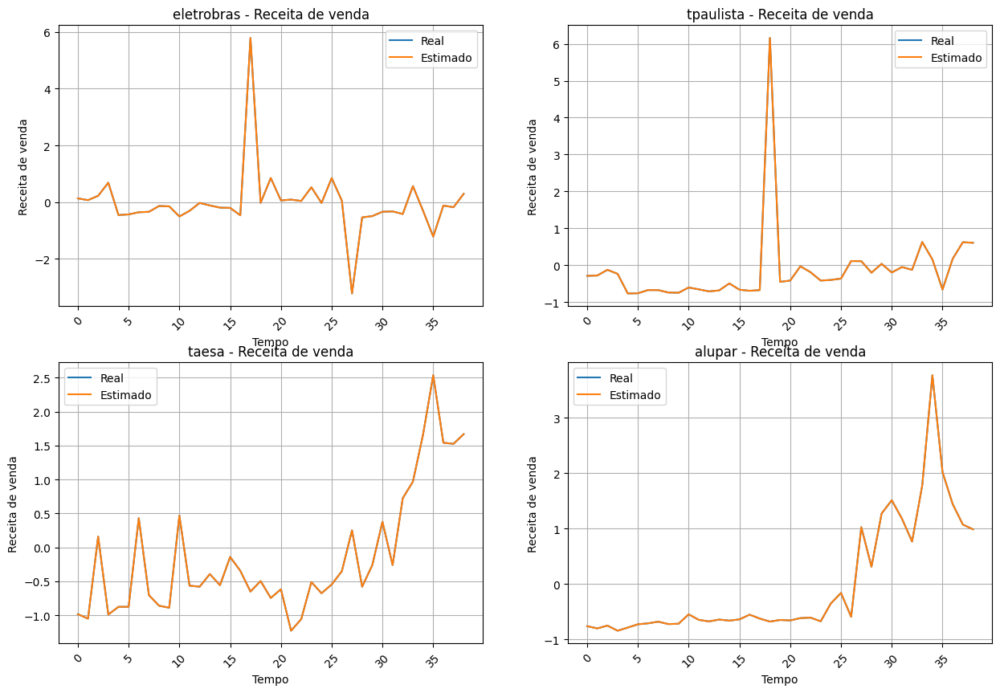

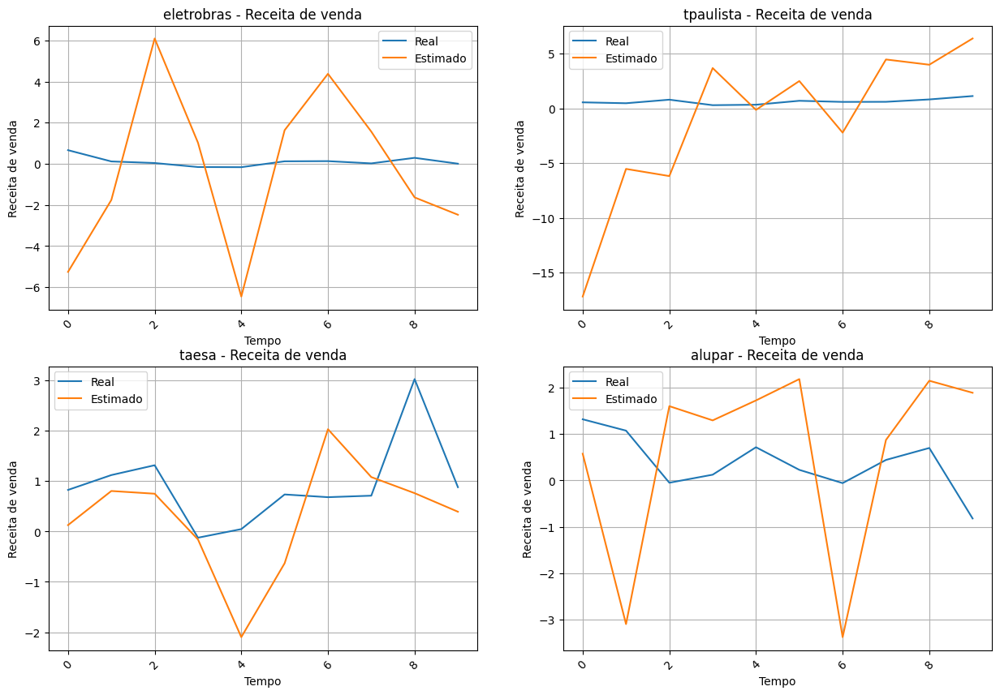

In [309]:
residual_armax = {}
residuo_armax_array = []
theta_armax = {}
y_estimado_armax = {}
train_proportion = 0.8
fig, axs = plt.subplots(2, 2, figsize=(15, 10))
fig2, axs2 = plt.subplots(2, 2, figsize=(15, 10))
for i,empresa in enumerate(psi_empresas.keys()):
    X = psi_empresas[empresa]
    y = np.array(dict_empresas[empresa]['Receita de venda'][4:])

    #train and test proportion 0.8 and 0.2

    train_size = int(len(X) * train_proportion)
    val_index = int(len(X) * (1-train_proportion))

    X_train, X_val = X[:train_size], X[train_size:]
    y_train, y_val = y[:train_size], y[train_size:]

    psi_pseudo_inv = np.linalg.pinv(X_train)
    theta_armax[empresa] = np.dot(psi_pseudo_inv, y_train)
    y_estimado_armax[empresa] = np.dot(X_train, theta_armax[empresa])
    #print(f"{empresa} - Theta = {np.shape(theta)}")
    residual_armax[empresa] = (y_train - np.dot(X_train, theta_armax[empresa]))
    mse = np.mean(residual_armax[empresa]**2)
    print(f'{empresa} - MSE: {mse}')

    ax = axs[i // 2, i % 2]  # Selecionar o subplot correspondente
    ax.set_title(f'{empresa} - Receita de venda')
    ax.set_xlabel('Tempo')
    ax.set_ylabel('Receita de venda')
    ax.plot(y_train, label='Real')
    ax.plot(y_estimado_armax[empresa], label='Estimado')
    ax.legend()
    ax.grid()
    ax.tick_params(axis='x', rotation=45)

    
    #############################TESTING###################################################################
    #Realizar o teste com os 20% e gerar os resíduos a partir disso, pois a parcela de 80% possui overfitting
    y_estimado_armax[empresa] = np.dot(X_val, theta_armax[empresa])
    
    #residual_armax[empresa] = y_val - y_estimado_armax[empresa]
    mse = np.mean(residual_armax[empresa]**2)
    print(f'{empresa} - test MSE: {mse}')

    ax2 = axs2[i // 2, i % 2]  # Selecionar o subplot correspondente
    ax2.set_title(f'{empresa} - Receita de venda')
    ax2.set_xlabel('Tempo')
    ax2.set_ylabel('Receita de venda')
    ax2.plot(y_val, label='Real')
    ax2.plot(y_estimado_armax[empresa], label='Estimado')
    #ax2.plot(residual_armax[empresa], label='Residual')
    ax2.legend()
    ax2.grid()
    ax2.tick_params(axis='x', rotation=45)

    

Building the extended least square matrix

In [310]:
#necessário rodar o bloco de cima antes desta execução
i = 0

psi_extended = {}
for empresa in psi_empresas.keys():
    print(f"****************** Begin {empresa} *********************")
    mse_initial = np.mean(residual_armax[empresa]**2)
    print(f"MSE inicial: {mse_initial}")
    j = 0
    
    
    while j<10:
        j=j+1
        psi_extended[empresa] = np.column_stack((X_train, residual_armax[empresa]))
        psi_residuo_pseudo_inv = np.linalg.pinv(psi_extended[empresa])
        theta_armax[empresa] = np.dot(psi_residuo_pseudo_inv, y_train)
        y_estimado_armax[empresa] = np.dot(psi_extended[empresa], theta_armax[empresa])

        residual_armax[empresa] = y_train - y_estimado_armax[empresa]
        print(f"Iteração {j} - MSE: {np.mean(residual_armax[empresa]**2)}")
        print(f"Variância do resíduo {np.var(residual_armax[empresa])}")
        print(f"Parâmetros theta* {theta_armax[empresa][-1]}")
    print(f"{i} - Numero de iterações para convergência: {j} - Residuo: {np.mean(residual_armax[empresa]**2)}")
    print(f"****************** End {empresa} *********************")
    #armazenar os valores de theta e y_estimado
    i= i + 1

        

****************** Begin eletrobras *********************
MSE inicial: 3.307248937626509e-29
Iteração 1 - MSE: 2.3808918813216417e-29
Variância do resíduo 2.3620453715962905e-29
Parâmetros theta* -1.793085850295625e-13
Iteração 2 - MSE: 2.3808918813216417e-29
Variância do resíduo 2.3620453715962905e-29
Parâmetros theta* 3.783642529494864e-14
Iteração 3 - MSE: 2.3808918813216417e-29
Variância do resíduo 2.3620453715962905e-29
Parâmetros theta* 3.783642529494864e-14
Iteração 4 - MSE: 2.3808918813216417e-29
Variância do resíduo 2.3620453715962905e-29
Parâmetros theta* 3.783642529494864e-14
Iteração 5 - MSE: 2.3808918813216417e-29
Variância do resíduo 2.3620453715962905e-29
Parâmetros theta* 3.783642529494864e-14
Iteração 6 - MSE: 2.3808918813216417e-29
Variância do resíduo 2.3620453715962905e-29
Parâmetros theta* 3.783642529494864e-14
Iteração 7 - MSE: 2.3808918813216417e-29
Variância do resíduo 2.3620453715962905e-29
Parâmetros theta* 3.783642529494864e-14
Iteração 8 - MSE: 2.38089188132

Generating the One-Step Ahead Graphs

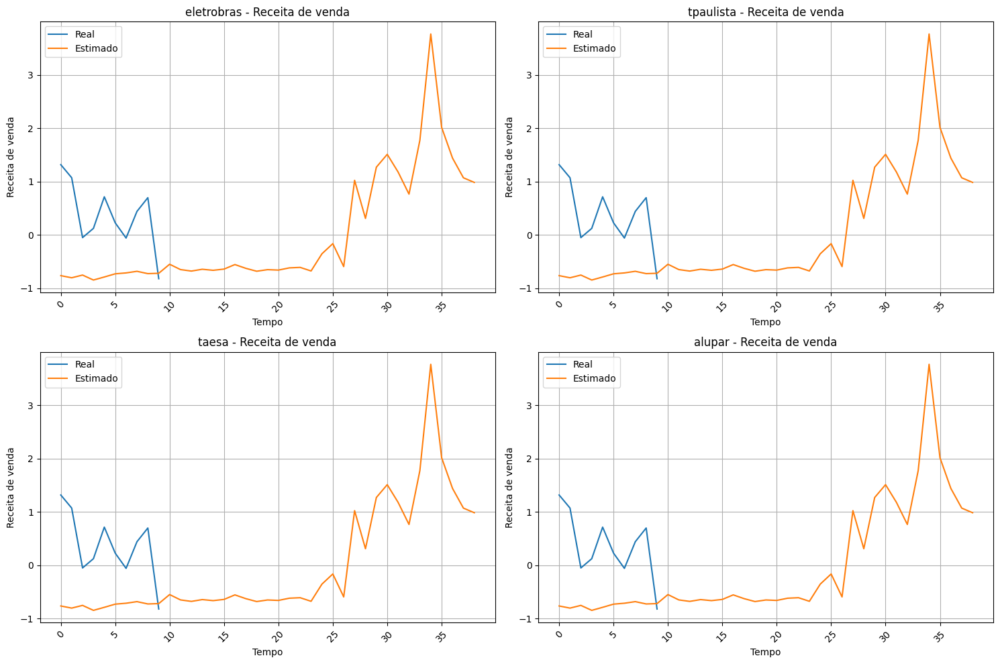

In [311]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10))
for i,empresa in enumerate(psi_empresas.keys()):
    ax = axs[i // 2, i % 2]  # Selecting the correspondent subplot
    ax.set_title(f'{empresa} - Receita de venda')
    ax.set_xlabel('Tempo')
    ax.set_ylabel('Receita de venda')
    ax.plot(y_val, label='Real')
    ax.plot(y_estimado_armax[empresa], label='Estimado')
    ax.legend()
    ax.grid()
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


One step ahead simulation

In [312]:
def one_step_ahead_simulation_armax(theta, psi_initial, steps, num_lags, exogenous_vars):
    """
    Free-run simulation for ARX model with exogenous variables and multiple lags.

    Parameters:
    - theta: The pre-existing ARX parameters (first num_lags parameters for y, then for exogenous inputs).
    - psi_initial: The initial regressor (past values of y and exogenous variables).
    - steps: Number of simulation steps to perform.
    - num_lags: Number of lags for the ARX model.
    - exogenous_vars: The fixed exogenous variables over time (remain constant during the free-run simulation).

    Returns:
    - y_estimation: The predicted output values for each step.
    """
    psi_free_run = np.array(psi_initial)  # Convert psi_initial to a numpy array
    y_estimation = []            # List to store the predicted y values
    y_error = []                 # List to store the error values
    # Extract the current autoregressive part (only get the first num_lags columns)

    current_psi = psi_free_run[:1, :]
    y_error = np.array(0)
    current_psi = np.column_stack((current_psi, y_error))

    # print(f"current_psi={np.shape(current_psi)}")
    # print(f"exogenous_vars = {np.shape(exogenous_vars)}")
    # print(f"current_psi={current_psi}")
    

    
    y_hat = sum(np.dot(current_psi, theta[:73]))  # Linear combination of theta and psi (tanking the residual coeficient off)
    print(f"y_hat={np.shape(y_hat)}")
    
    # Append the estimated value to the list
    y_estimation.append(y_hat)
    print(y_estimation)
    print(y_real[1])

    # Error list
    y_error = np.append(y_error, y_real[1] - y_hat)
    # print(f"Erro = {y_error}")

    # Building the autoregressive part  
    psi_ar_part = psi_free_run[:, :num_lags]
    # print(f"psi_ar_part={np.shape(psi_ar_part)}")

    # Loop for the number of simulation steps
    for t in range(steps):
        print(t)
        
        if t == 0:
            continue
        
        print(f"Start Step {t+1} ********************************************")
        #Updating the autoregressive part whith the new estimated value
        psi_lag_4 = np.insert(psi_ar_part[:,0], 1, psi_ar_part[:,1].copy()[-1], axis=0)
        psi_lag_3 = np.insert(psi_ar_part[:,1], 1, psi_ar_part[:,2].copy()[-1], axis=0)
        psi_lag_2 = np.insert(psi_ar_part[:,2], 1, psi_ar_part[:,3].copy()[-1], axis=0)
        psi_lag_1 = np.insert(psi_ar_part[:,3], 1, y_estimation[-1])
        # print(f"psi_lag_4={np.shape(psi_lag_4)}")
        # print(f"psi_lag_3={np.shape(psi_lag_3)}")
        # print(f"psi_lag_2={np.shape(psi_lag_2)}")
        # print(f"psi_lag_1={np.shape(psi_lag_1)}")

         # Transform the arrays into columns of a matrix
        psi_ar_part = np.column_stack((psi_lag_4, psi_lag_3, psi_lag_2, psi_lag_1))
        # print(f"psi_ar_part={np.shape(psi_ar_part)}")
        # print(f"exogenous_vars={np.shape(exogenous_vars[:t+1])}")
        # print(f"y_error={np.shape(y_error)}")


        # Combine the autoregressive part with the fixed exogenous variables
        print(f"current_psi={np.shape(current_psi)}")
        current_psi = np.column_stack((psi_ar_part, exogenous_vars[:t+1], y_error))
        

        # Estimate y using the current psi and theta
        y_estimation = np.dot(current_psi, theta[:73])  # Linear combination of theta and psi
        # print(f"current_psi={current_psi[-1]}")
        # print(f"y_hat={y_hat}")
        # # Append the estimated value to the list
        # print(10*'*')
        # print(f"Estimation shape={np.shape(y_estimation)}")

        # Uptaing the error list
        y_error = np.append(y_error, y_real[i+1] - y_estimation[-1]) 
        print(f"Erro = {y_error}")

        # Update psi: Shift the autoregressive part and append the new y_hat
        # print(f"Current psi {np.shape(current_psi)}")
        print(f"MSE = {np.mean((y_real[t+1] - y_estimation[-1])**2)}")
        print(f"End Step {t+1} - y_hat: {y_estimation[-1]}")

       

    return np.array(y_estimation), np.array(theta), np.array(y_error)


In [316]:
#Function implementation
y_simulation_armax = {}
theta_armax_cross =  {}
y_error = {}

for empresa in psi_empresas.keys():
    X = psi_empresas[empresa]
    y = np.array(dict_empresas[empresa]['Receita de venda'][4:])
    y_train, y_val = y[:train_size], y[train_size:]
    X_train, X_val = X[:train_size], X[train_size:]
    num_lags = 4                                          # 4 lags in the model
    psi_initial = X[:1]                     # Initial regressor (first row of psi matrix)
    exogenous_vars = psi_empresas[empresa][:,4:]          # Exogenous variables (remain constant) 
    print(exogenous_vars.shape)                           # Exogenous variables remain constant
    steps = len(psi_empresas[empresa]) - 1         # Number of steps for simulation
                    
    # Perform the free-run simulation
    y_simulation_armax[empresa], theta_armax_cross[empresa], y_error[empresa] = one_step_ahead_simulation_armax(theta_armax[empresa], psi_initial, steps, num_lags, exogenous_vars)

(49, 68)
y_hat=()
[2.29315034119088]
-0.8037042711847036
0
1
Start Step 2 ********************************************
current_psi=(1, 73)
Erro = [ 0.         -3.09685461 -0.82258241]
MSE = 0.7325931832371206
End Step 2 - y_hat: 0.10304592556811276
2
Start Step 3 ********************************************
current_psi=(2, 73)
Erro = [ 0.         -3.09685461 -0.82258241  4.41149349]
MSE = 18.361401915722755
End Step 3 - y_hat: -5.131029975728339
3
Start Step 4 ********************************************
current_psi=(3, 73)
Erro = [ 0.         -3.09685461 -0.82258241  4.41149349 -1.6787236 ]
MSE = 3.0564112036522095
End Step 4 - y_hat: 0.9591871146893434
4
Start Step 5 ********************************************
current_psi=(4, 73)
Erro = [ 0.         -3.09685461 -0.82258241  4.41149349 -1.6787236  -2.94210589]
MSE = 8.715067006309923
End Step 5 - y_hat: 2.22256940186099
5
Start Step 6 ********************************************
current_psi=(5, 73)
Erro = [ 0.         -3.09685461 -0.

************** Company: eletrobras **************
MSE Free Run 10.318311214622254
RMSE Free Run 3.2122128221246884
************** Company: tpaulista **************
MSE Free Run 3.9876635678294554
RMSE Free Run 1.9969135103527782
************** Company: taesa **************
MSE Free Run 3.835583449254241
RMSE Free Run 1.9584645642069303
************** Company: alupar **************
MSE Free Run 0.8796570058634691
RMSE Free Run 0.9379003176582622


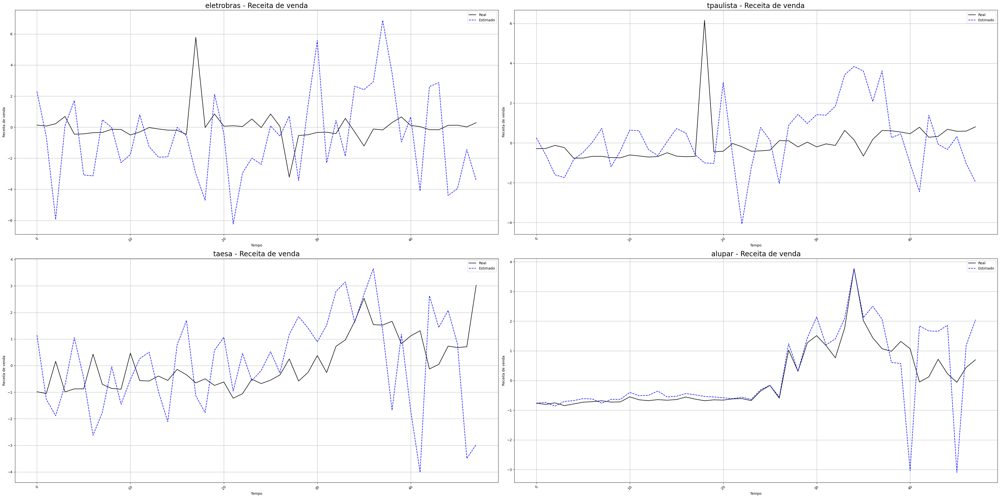

In [317]:
plot_company_sales(psi_empresas, dict_empresas, y_simulation_armax)

ARMAX - ONE STEP AHEAD - CROSS VALIDATION

(13, 68)
y_hat=()
[2.29315034119088]
-0.8037042711847036
0
1
Start Step 2 ********************************************
current_psi=(1, 73)
Erro = [ 0.         -3.09685461 -0.85591657]
MSE = 0.7325931832371206
End Step 2 - y_hat: 0.10304592556811276
2
Start Step 3 ********************************************
current_psi=(2, 73)
Erro = [ 0.         -3.09685461 -0.85591657  4.37815933]
MSE = 18.36140191572277
End Step 3 - y_hat: -5.131029975728341
3
Start Step 4 ********************************************
current_psi=(3, 73)
Erro = [ 0.         -3.09685461 -0.85591657  4.37815933 -1.71205776]
MSE = 3.056411203652205
End Step 4 - y_hat: 0.959187114689342
4
Start Step 5 ********************************************
current_psi=(4, 73)
Erro = [ 0.         -3.09685461 -0.85591657  4.37815933 -1.71205776 -2.97544005]
MSE = 8.715067006309914
End Step 5 - y_hat: 2.2225694018609885
5
Start Step 6 ********************************************
current_psi=(5, 73)
Erro = [ 0.         -3.09685461 -0.8

C:\Users\giova\AppData\Local\Temp\ipykernel_13372\192929146.py:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_val = y[train_index], y[val_index]
C:\Users\giova\AppData\Local\Temp\ipykernel_13372\192929146.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  X_val_error = np.append(X_val[i], y_val[i-1] - y_armax[i-1])


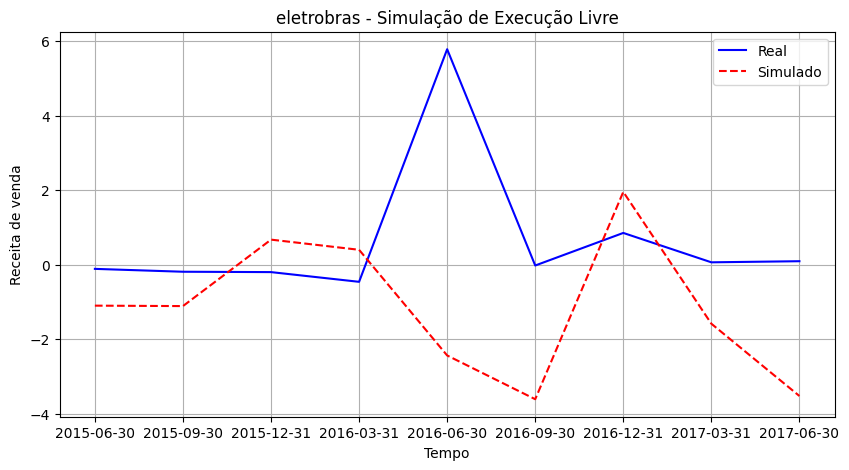

MSE: 3.223200874333021
RMSE: 1.7953275117184109
************** Company: eletrobras **************
(22, 68)
y_hat=()
[2.29315034119088]
-0.8037042711847036
0
1
Start Step 2 ********************************************
current_psi=(1, 73)
Erro = [ 0.         -3.09685461 -0.65284357]
MSE = 0.7325931832371206
End Step 2 - y_hat: 0.10304592556811276
2
Start Step 3 ********************************************
current_psi=(2, 73)
Erro = [ 0.         -3.09685461 -0.65284357  4.58123234]
MSE = 18.36140191572271
End Step 3 - y_hat: -5.1310299757283335
3
Start Step 4 ********************************************
current_psi=(3, 73)
Erro = [ 0.         -3.09685461 -0.65284357  4.58123234 -1.50898476]
MSE = 3.056411203652232
End Step 4 - y_hat: 0.9591871146893498
4
Start Step 5 ********************************************
current_psi=(4, 73)
Erro = [ 0.         -3.09685461 -0.65284357  4.58123234 -1.50898476 -2.77236704]
MSE = 8.715067006309958
End Step 5 - y_hat: 2.222569401860996
5
Start Step 6 **

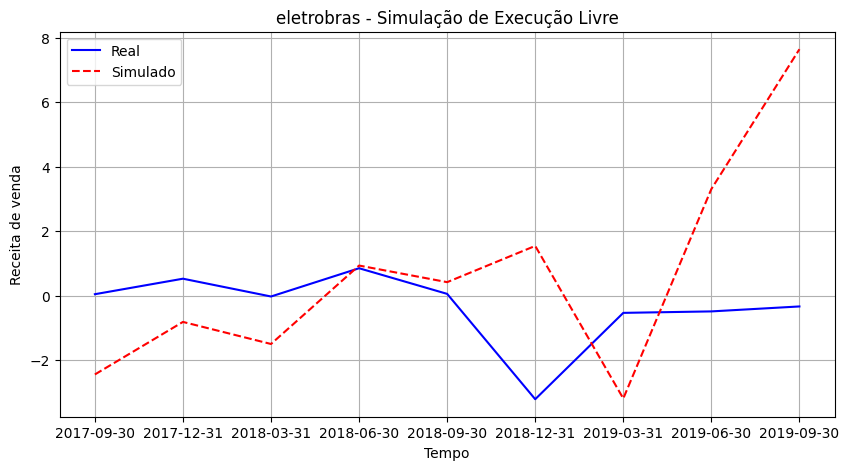

MSE: 1.0046690086870718
RMSE: 1.0023317857311878
************** Company: eletrobras **************
(31, 68)
y_hat=()
[2.29315034119088]
-0.8037042711847036
0
1
Start Step 2 ********************************************
current_psi=(1, 73)
Erro = [ 0.         -3.09685461 -0.65284357]
MSE = 0.7325931832371206
End Step 2 - y_hat: 0.10304592556811276
2
Start Step 3 ********************************************
current_psi=(2, 73)
Erro = [ 0.         -3.09685461 -0.65284357  4.58123234]
MSE = 18.36140191572271
End Step 3 - y_hat: -5.1310299757283335
3
Start Step 4 ********************************************
current_psi=(3, 73)
Erro = [ 0.         -3.09685461 -0.65284357  4.58123234 -1.50898476]
MSE = 3.056411203652232
End Step 4 - y_hat: 0.9591871146893498
4
Start Step 5 ********************************************
current_psi=(4, 73)
Erro = [ 0.         -3.09685461 -0.65284357  4.58123234 -1.50898476 -2.77236704]
MSE = 8.715067006309958
End Step 5 - y_hat: 2.222569401860996
5
Start Step 6 *

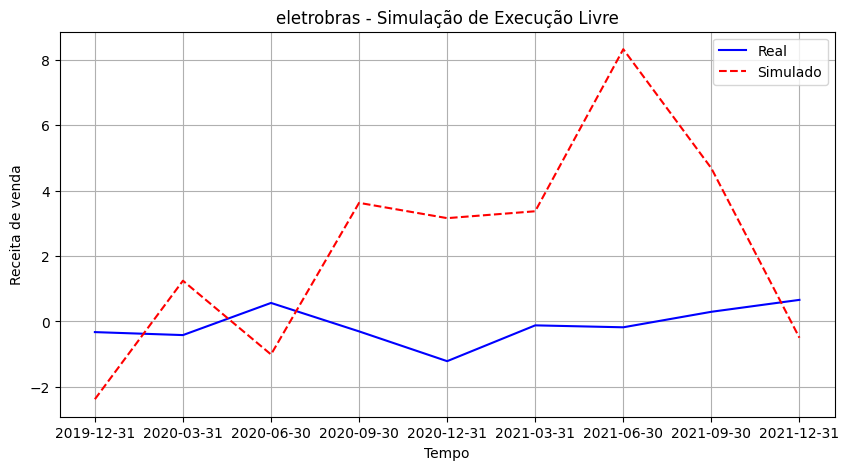

MSE: 5.735148456652003
RMSE: 2.394816998572543
************** Company: eletrobras **************
(40, 68)
y_hat=()
[2.29315034119088]
-0.8037042711847036
0
1
Start Step 2 ********************************************
current_psi=(1, 73)
Erro = [ 0.         -3.09685461 -0.65284357]
MSE = 0.7325931832371206
End Step 2 - y_hat: 0.10304592556811276
2
Start Step 3 ********************************************
current_psi=(2, 73)
Erro = [ 0.         -3.09685461 -0.65284357  4.58123234]
MSE = 18.36140191572271
End Step 3 - y_hat: -5.1310299757283335
3
Start Step 4 ********************************************
current_psi=(3, 73)
Erro = [ 0.         -3.09685461 -0.65284357  4.58123234 -1.50898476]
MSE = 3.056411203652232
End Step 4 - y_hat: 0.9591871146893498
4
Start Step 5 ********************************************
current_psi=(4, 73)
Erro = [ 0.         -3.09685461 -0.65284357  4.58123234 -1.50898476 -2.77236704]
MSE = 8.715067006309958
End Step 5 - y_hat: 2.222569401860996
5
Start Step 6 ***

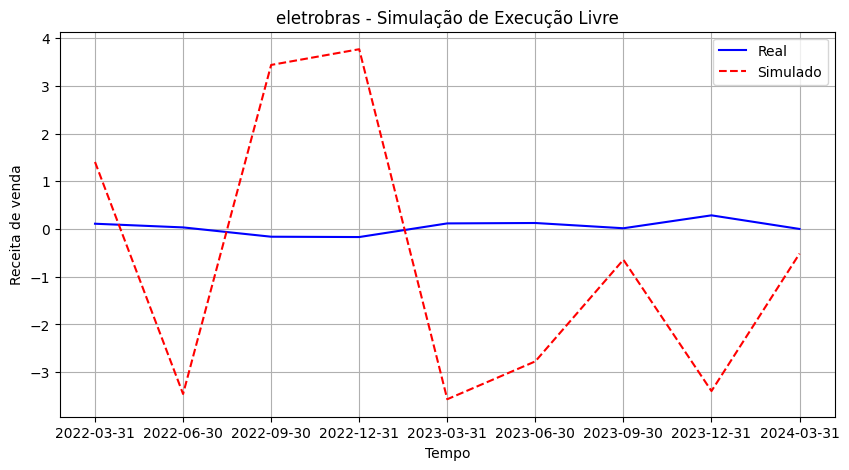

MSE: 0.4605588974313913
RMSE: 0.6786448978894568
************** Company: eletrobras **************
(13, 68)
y_hat=()
[0.25950594552728323]
-0.8037042711847036
0
1
Start Step 2 ********************************************
current_psi=(1, 73)
Erro = [ 0.         -1.06321022 -0.18712601]
MSE = 0.03501614519129478
End Step 2 - y_hat: -0.5657446351578143
2
Start Step 3 ********************************************
current_psi=(2, 73)
Erro = [ 0.         -1.06321022 -0.18712601  0.89159965]
MSE = 0.6375399188535399
End Step 3 - y_hat: -1.6444703010678134
3
Start Step 4 ********************************************
current_psi=(3, 73)
Erro = [ 0.         -1.06321022 -0.18712601  0.89159965  1.00352518]
MSE = 0.9357146806018016
End Step 4 - y_hat: -1.7563958259049142
4
Start Step 5 ********************************************
current_psi=(4, 73)
Erro = [ 0.         -1.06321022 -0.18712601  0.89159965  1.00352518  0.10722004]
MSE = 0.01703830590381483
End Step 5 - y_hat: -0.860090692678936
5
Star

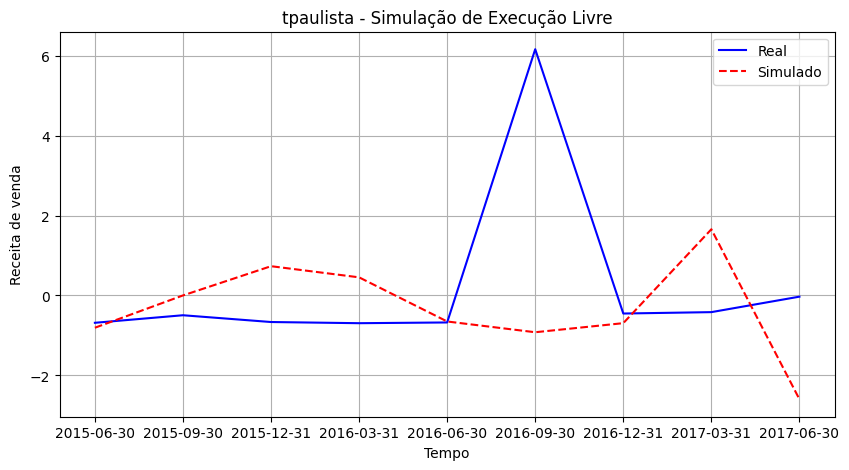

MSE: 0.2932292885693333
RMSE: 0.5415064991016574
************** Company: tpaulista **************
(22, 68)
y_hat=()
[0.25950594552728323]
-0.8037042711847036
0
1
Start Step 2 ********************************************
current_psi=(1, 73)
Erro = [ 0.         -1.06321022  0.01594699]
MSE = 0.03501614519129478
End Step 2 - y_hat: -0.5657446351578143
2
Start Step 3 ********************************************
current_psi=(2, 73)
Erro = [ 0.         -1.06321022  0.01594699  1.09467266]
MSE = 0.6375399188535278
End Step 3 - y_hat: -1.644470301067806
3
Start Step 4 ********************************************
current_psi=(3, 73)
Erro = [ 0.         -1.06321022  0.01594699  1.09467266  1.20659819]
MSE = 0.9357146806017866
End Step 4 - y_hat: -1.7563958259049064
4
Start Step 5 ********************************************
current_psi=(4, 73)
Erro = [ 0.         -1.06321022  0.01594699  1.09467266  1.20659819  0.31029305]
MSE = 0.017038305903812858
End Step 5 - y_hat: -0.8600906926789285
5
Star

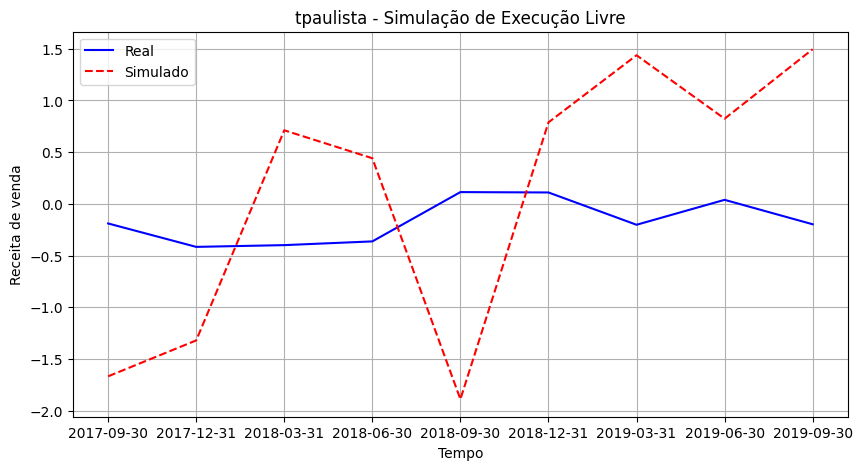

MSE: 0.06664206874573957
RMSE: 0.25815125168346476
************** Company: tpaulista **************
(31, 68)
y_hat=()
[0.25950594552728323]
-0.8037042711847036
0
1
Start Step 2 ********************************************
current_psi=(1, 73)
Erro = [ 0.         -1.06321022  0.01594699]
MSE = 0.03501614519129478
End Step 2 - y_hat: -0.5657446351578143
2
Start Step 3 ********************************************
current_psi=(2, 73)
Erro = [ 0.         -1.06321022  0.01594699  1.09467266]
MSE = 0.6375399188535278
End Step 3 - y_hat: -1.644470301067806
3
Start Step 4 ********************************************
current_psi=(3, 73)
Erro = [ 0.         -1.06321022  0.01594699  1.09467266  1.20659819]
MSE = 0.9357146806017866
End Step 4 - y_hat: -1.7563958259049064
4
Start Step 5 ********************************************
current_psi=(4, 73)
Erro = [ 0.         -1.06321022  0.01594699  1.09467266  1.20659819  0.31029305]
MSE = 0.017038305903812858
End Step 5 - y_hat: -0.8600906926789285
5
St

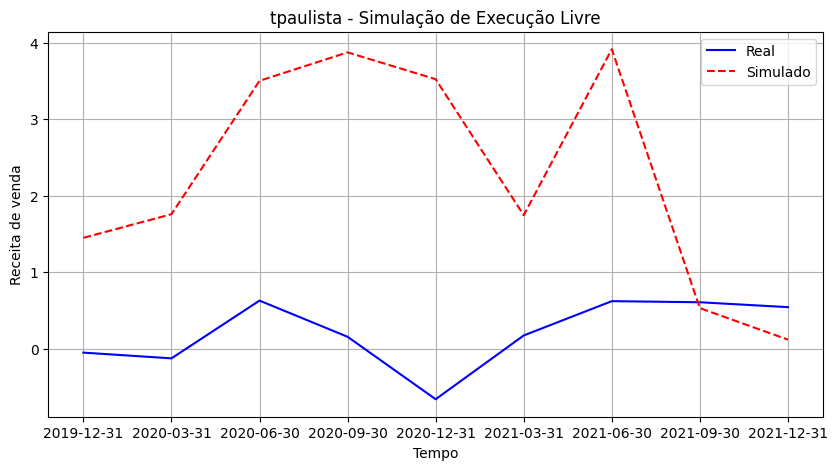

MSE: 4.238643001672768
RMSE: 2.0587964935060405
************** Company: tpaulista **************
(40, 68)
y_hat=()
[0.25950594552728323]
-0.8037042711847036
0
1
Start Step 2 ********************************************
current_psi=(1, 73)
Erro = [ 0.         -1.06321022  0.01594699]
MSE = 0.03501614519129478
End Step 2 - y_hat: -0.5657446351578143
2
Start Step 3 ********************************************
current_psi=(2, 73)
Erro = [ 0.         -1.06321022  0.01594699  1.09467266]
MSE = 0.6375399188535278
End Step 3 - y_hat: -1.644470301067806
3
Start Step 4 ********************************************
current_psi=(3, 73)
Erro = [ 0.         -1.06321022  0.01594699  1.09467266  1.20659819]
MSE = 0.9357146806017866
End Step 4 - y_hat: -1.7563958259049064
4
Start Step 5 ********************************************
current_psi=(4, 73)
Erro = [ 0.         -1.06321022  0.01594699  1.09467266  1.20659819  0.31029305]
MSE = 0.017038305903812858
End Step 5 - y_hat: -0.8600906926789285
5
Start

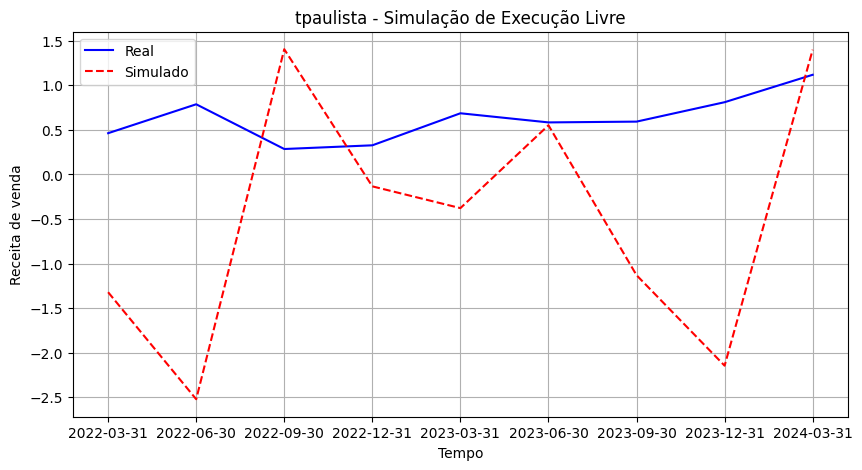

MSE: 1.2162626520798607
RMSE: 1.1028429861407565
************** Company: tpaulista **************
(13, 68)
y_hat=()
[1.1448468364311908]
-0.8037042711847036
0
1
Start Step 2 ********************************************
current_psi=(1, 73)
Erro = [ 0.         -1.94855111  0.55893636]
MSE = 0.3124098594042571
End Step 2 - y_hat: -1.311807013720515
2
Start Step 3 ********************************************
current_psi=(2, 73)
Erro = [ 0.         -1.94855111  0.55893636  1.39008687]
MSE = 1.682074596848949
End Step 3 - y_hat: -2.142957518046542
3
Start Step 4 ********************************************
current_psi=(3, 73)
Erro = [ 0.         -1.94855111  0.55893636  1.39008687  0.29690386]
MSE = 0.06796560932652788
End Step 4 - y_hat: -1.0497745104263805
4
Start Step 5 ********************************************
current_psi=(4, 73)
Erro = [ 0.         -1.94855111  0.55893636  1.39008687  0.29690386 -1.52327704]
MSE = 2.249898673183174
End Step 5 - y_hat: 0.7704063932177847
5
Start Step 

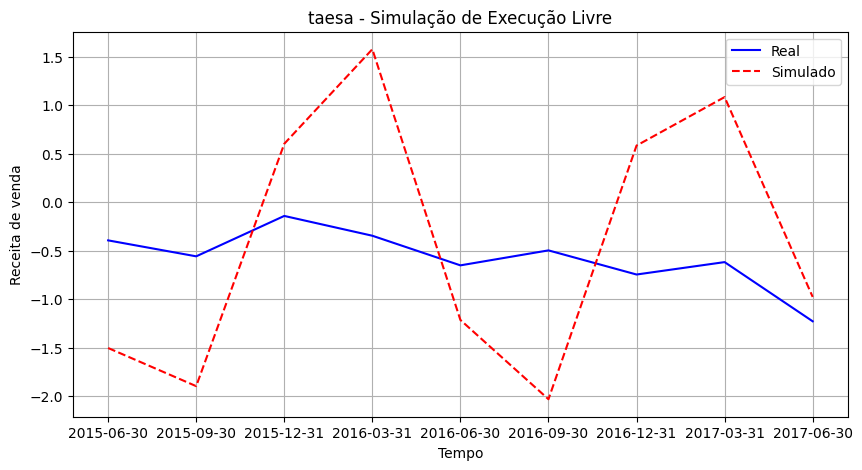

MSE: 0.024326306043706374
RMSE: 0.1559689265325192
************** Company: taesa **************
(22, 68)
y_hat=()
[1.1448468364311908]
-0.8037042711847036
0
1
Start Step 2 ********************************************
current_psi=(1, 73)
Erro = [ 0.         -1.94855111  0.76200937]
MSE = 0.3124098594042571
End Step 2 - y_hat: -1.311807013720515
2
Start Step 3 ********************************************
current_psi=(2, 73)
Erro = [ 0.         -1.94855111  0.76200937  1.59315988]
MSE = 1.6820745968489295
End Step 3 - y_hat: -2.1429575180465346
3
Start Step 4 ********************************************
current_psi=(3, 73)
Erro = [ 0.         -1.94855111  0.76200937  1.59315988  0.49997687]
MSE = 0.06796560932652394
End Step 4 - y_hat: -1.049774510426373
4
Start Step 5 ********************************************
current_psi=(4, 73)
Erro = [ 0.         -1.94855111  0.76200937  1.59315988  0.49997687 -1.32020403]
MSE = 2.2498986731831967
End Step 5 - y_hat: 0.7704063932177923
5
Start Step 

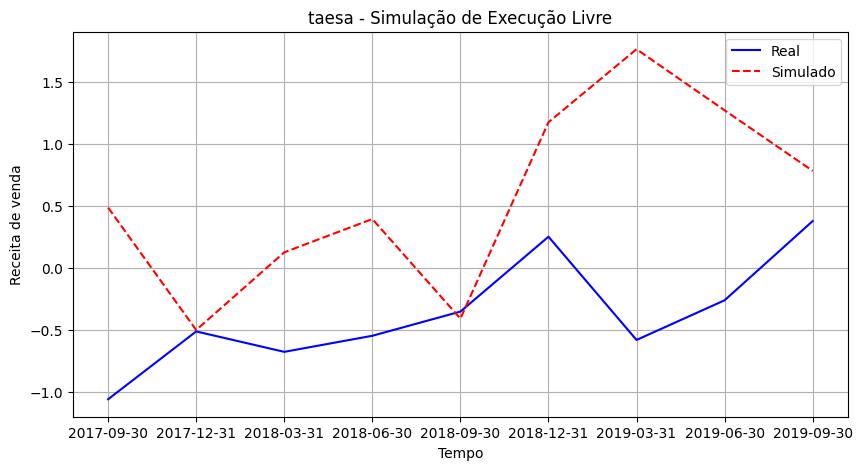

MSE: 0.8778886481081918
RMSE: 0.9369571218087793
************** Company: taesa **************
(31, 68)
y_hat=()
[1.1448468364311908]
-0.8037042711847036
0
1
Start Step 2 ********************************************
current_psi=(1, 73)
Erro = [ 0.         -1.94855111  0.76200937]
MSE = 0.3124098594042571
End Step 2 - y_hat: -1.311807013720515
2
Start Step 3 ********************************************
current_psi=(2, 73)
Erro = [ 0.         -1.94855111  0.76200937  1.59315988]
MSE = 1.6820745968489295
End Step 3 - y_hat: -2.1429575180465346
3
Start Step 4 ********************************************
current_psi=(3, 73)
Erro = [ 0.         -1.94855111  0.76200937  1.59315988  0.49997687]
MSE = 0.06796560932652394
End Step 4 - y_hat: -1.049774510426373
4
Start Step 5 ********************************************
current_psi=(4, 73)
Erro = [ 0.         -1.94855111  0.76200937  1.59315988  0.49997687 -1.32020403]
MSE = 2.2498986731831967
End Step 5 - y_hat: 0.7704063932177923
5
Start Step 6 

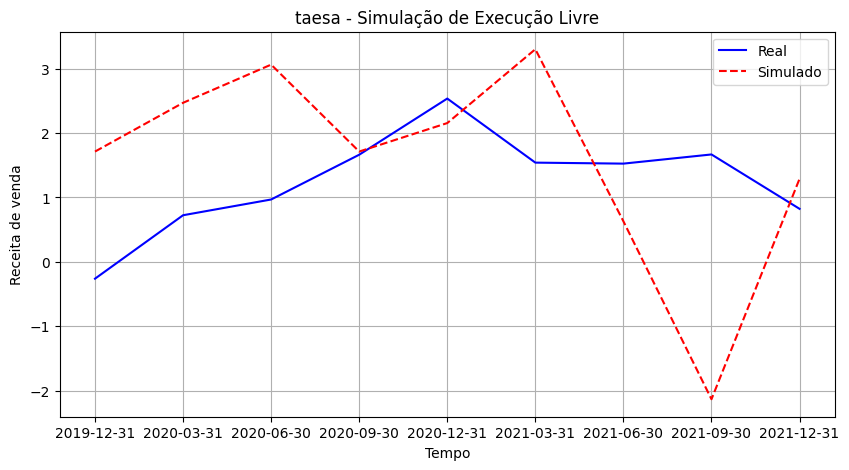

MSE: 0.11209401649089672
RMSE: 0.33480444514805463
************** Company: taesa **************
(40, 68)
y_hat=()
[1.1448468364311908]
-0.8037042711847036
0
1
Start Step 2 ********************************************
current_psi=(1, 73)
Erro = [ 0.         -1.94855111  0.76200937]
MSE = 0.3124098594042571
End Step 2 - y_hat: -1.311807013720515
2
Start Step 3 ********************************************
current_psi=(2, 73)
Erro = [ 0.         -1.94855111  0.76200937  1.59315988]
MSE = 1.6820745968489295
End Step 3 - y_hat: -2.1429575180465346
3
Start Step 4 ********************************************
current_psi=(3, 73)
Erro = [ 0.         -1.94855111  0.76200937  1.59315988  0.49997687]
MSE = 0.06796560932652394
End Step 4 - y_hat: -1.049774510426373
4
Start Step 5 ********************************************
current_psi=(4, 73)
Erro = [ 0.         -1.94855111  0.76200937  1.59315988  0.49997687 -1.32020403]
MSE = 2.2498986731831967
End Step 5 - y_hat: 0.7704063932177923
5
Start Step 

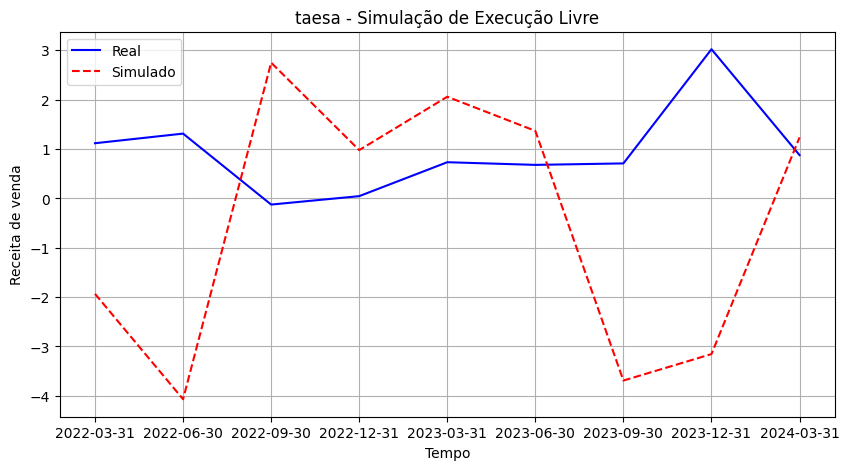

MSE: 2.0316007201780644
RMSE: 1.4253423168411385
************** Company: taesa **************
(13, 68)
y_hat=()
[-0.7636980430267601]
-0.8037042711847036
0
1
Start Step 2 ********************************************
current_psi=(1, 73)
Erro = [ 0.         -0.04000623  0.05083362]
MSE = 0.0025840571077906977
End Step 2 - y_hat: -0.8037042711847073
2
Start Step 3 ********************************************
current_psi=(2, 73)
Erro = [ 0.         -0.04000623  0.05083362 -0.03131526]
MSE = 0.015488782754160876
End Step 3 - y_hat: -0.7215553938867605
3
Start Step 4 ********************************************
current_psi=(3, 73)
Erro = [ 0.         -0.04000623  0.05083362 -0.03131526  0.05070424]
MSE = 0.00021032325121120288
End Step 4 - y_hat: -0.8035748893478393
4
Start Step 5 ********************************************
current_psi=(4, 73)
Erro = [ 0.         -0.04000623  0.05083362 -0.03131526  0.05070424  0.01377755]
MSE = 0.0013755469406117908
End Step 5 - y_hat: -0.7666481974442712


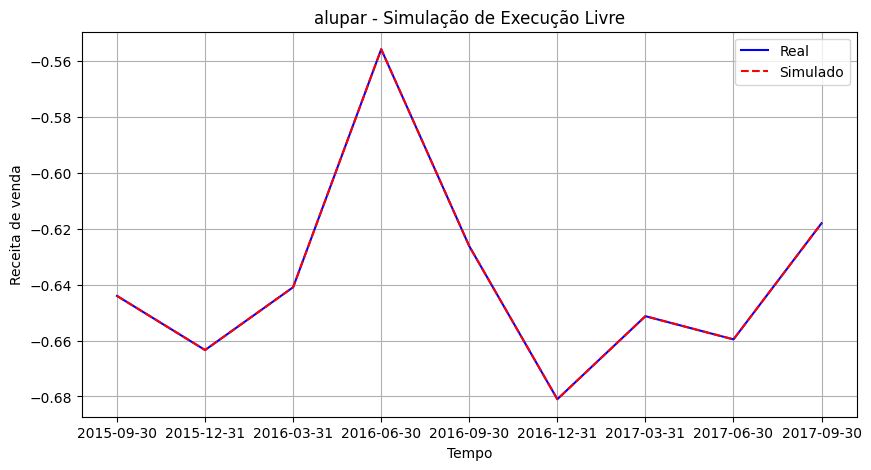

MSE: 1.9503003290267314e-29
RMSE: 4.416220475731178e-15
************** Company: alupar **************
(22, 68)
y_hat=()
[-0.7636980430267601]
-0.8037042711847036
0
1
Start Step 2 ********************************************
current_psi=(1, 73)
Erro = [ 0.         -0.04000623  0.25390663]
MSE = 0.0025840571077906977
End Step 2 - y_hat: -0.8037042711847073
2
Start Step 3 ********************************************
current_psi=(2, 73)
Erro = [ 0.         -0.04000623  0.25390663  0.17175775]
MSE = 0.015488782754162756
End Step 3 - y_hat: -0.7215553938867529
3
Start Step 4 ********************************************
current_psi=(3, 73)
Erro = [ 0.         -0.04000623  0.25390663  0.17175775  0.25377725]
MSE = 0.00021032325121098067
End Step 4 - y_hat: -0.8035748893478316
4
Start Step 5 ********************************************
current_psi=(4, 73)
Erro = [ 0.         -0.04000623  0.25390663  0.17175775  0.25377725  0.21685056]
MSE = 0.0013755469406112307
End Step 5 - y_hat: -0.766648197

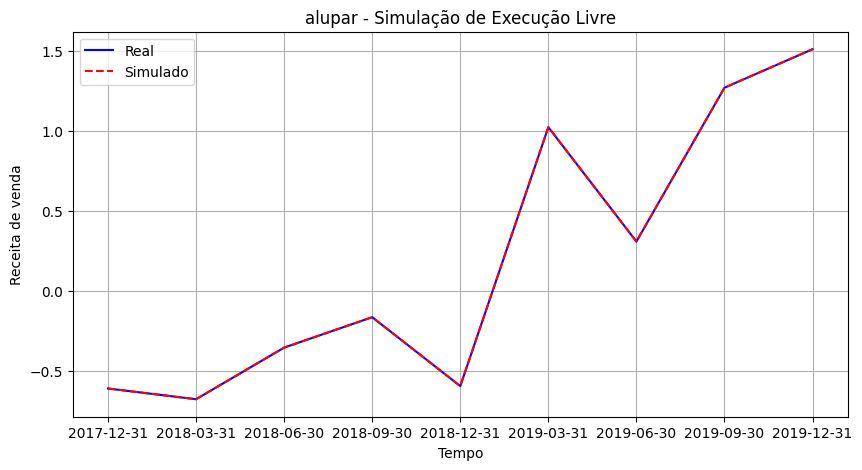

MSE: 2.9825759533819117e-30
RMSE: 1.7270135938613546e-15
************** Company: alupar **************
(31, 68)
y_hat=()
[-0.7636980430267601]
-0.8037042711847036
0
1
Start Step 2 ********************************************
current_psi=(1, 73)
Erro = [ 0.         -0.04000623  0.25390663]
MSE = 0.0025840571077906977
End Step 2 - y_hat: -0.8037042711847073
2
Start Step 3 ********************************************
current_psi=(2, 73)
Erro = [ 0.         -0.04000623  0.25390663  0.17175775]
MSE = 0.015488782754162756
End Step 3 - y_hat: -0.7215553938867529
3
Start Step 4 ********************************************
current_psi=(3, 73)
Erro = [ 0.         -0.04000623  0.25390663  0.17175775  0.25377725]
MSE = 0.00021032325121098067
End Step 4 - y_hat: -0.8035748893478316
4
Start Step 5 ********************************************
current_psi=(4, 73)
Erro = [ 0.         -0.04000623  0.25390663  0.17175775  0.25377725  0.21685056]
MSE = 0.0013755469406112307
End Step 5 - y_hat: -0.76664819

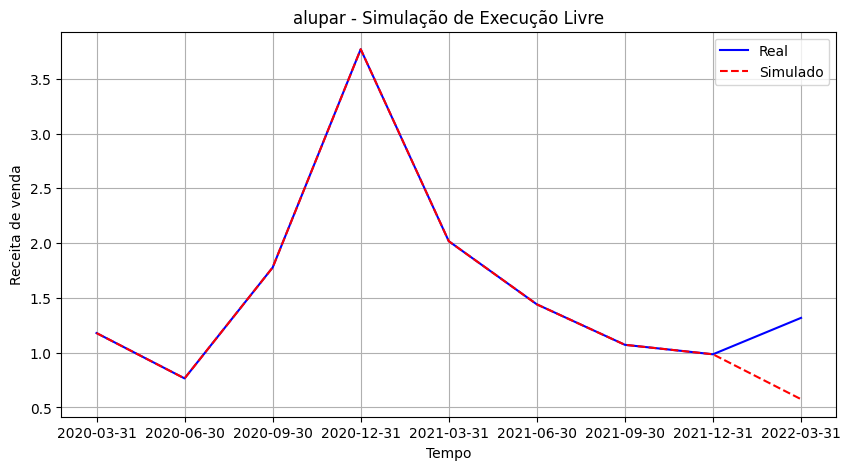

MSE: 0.006805095156183647
RMSE: 0.08249300064965298
************** Company: alupar **************
(40, 68)
y_hat=()
[-0.7636980430267601]
-0.8037042711847036
0
1
Start Step 2 ********************************************
current_psi=(1, 73)
Erro = [ 0.         -0.04000623  0.25390663]
MSE = 0.0025840571077906977
End Step 2 - y_hat: -0.8037042711847073
2
Start Step 3 ********************************************
current_psi=(2, 73)
Erro = [ 0.         -0.04000623  0.25390663  0.17175775]
MSE = 0.015488782754162756
End Step 3 - y_hat: -0.7215553938867529
3
Start Step 4 ********************************************
current_psi=(3, 73)
Erro = [ 0.         -0.04000623  0.25390663  0.17175775  0.25377725]
MSE = 0.00021032325121098067
End Step 4 - y_hat: -0.8035748893478316
4
Start Step 5 ********************************************
current_psi=(4, 73)
Erro = [ 0.         -0.04000623  0.25390663  0.17175775  0.25377725  0.21685056]
MSE = 0.0013755469406112307
End Step 5 - y_hat: -0.7666481974442

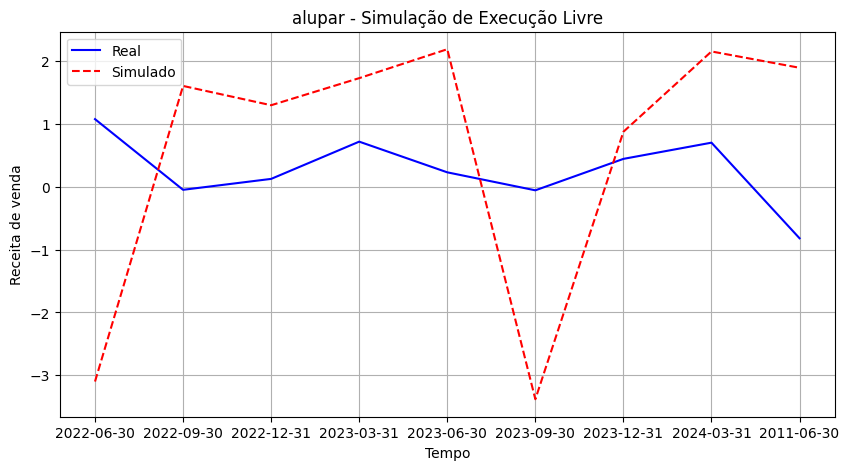

MSE: 0.10296792881313871
RMSE: 0.32088616176634777
************** Company: alupar **************


In [318]:
import random

rand_num = random.random()

#Function implementation
y_simulation_armax = {}
theta_armax_cross =  {}
y_error = {}
n_splits = 4

tscv = TimeSeriesSplit(n_splits=n_splits)

for empresa in psi_empresas.keys():
    X = psi_empresas[empresa]
    y = dict_empresas[empresa]['Receita de venda'][4:]
    i = 0
    for train_index, val_index in tscv.split(X):
        i = i + 1

        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]
        num_lags = 4                                          # 4 lags in the model
        psi_initial = X_train[:1]                             # Initial regressor (first row of psi matrix)
        exogenous_vars = X_train[:,4:]                        # Exogenous variables (remain constant) 
        print(exogenous_vars.shape)                           # Exogenous variables remain constant
        steps = len(X_train)                                  # Number of steps for simulation
                    
    # Perform the OSA simulation
        y_simulation_armax[empresa], theta_armax_cross[empresa], y_error[empresa] = one_step_ahead_simulation_armax(theta_armax[empresa], psi_initial, steps, num_lags, exogenous_vars)
        
        y_armax = np.zeros(len(y_val))

        print(f"************** Split {i} **************")
        # Validation of the model
        print(f"************** Company: {empresa} **************")
        
        X_val_error = np.append(X_val[0], rand_num)
        y_armax[0] = np.dot(X_val_error, theta_armax_cross[empresa])
        X_final = X_val_error
        for i in range(1, len(X_val)):
            X_val_error = np.append(X_val[i], y_val[i-1] - y_armax[i-1])
            y_armax[i] = np.dot(X_val_error, theta_armax_cross[empresa])
            X_final = np.vstack((X_final, X_val_error)) 
        mse = np.mean((y_val - y_armax))**2
        print(f"Real: {y_val} - Estimado: {y_armax}")
        plt.figure(figsize=(10, 5))
        plt.plot(y_val, label='Real', color='blue')
        plt.plot(y_armax, label='Simulado', color='red', linestyle='dashed')
        plt.title(f'{empresa} - Simulação de Execução Livre')
        plt.xlabel('Tempo')
        plt.ylabel('Receita de venda')
        plt.legend()
        plt.grid()
        plt.show()
        print(f"MSE: {mse}")
        print(f"RMSE: {np.sqrt(mse)}")
        print(f"************** Company: {empresa} **************")

# ARIMAX MODEL - BATCH

In [ ]:
class ARIMAXModel:
    def __init__(self, psi_empresas, empresa, order, steps):
        self.psi_empresas = psi_empresas
        self.empresa = empresa
        self.order = order  # (p, d, q)
        self.steps = steps
        self.psi_ar_part = psi_empresas[empresa][:, :4]
        self.exogenous_vars = psi_empresas[empresa][:, 4:]
        self.y_estimation = []
        self.errors = []

    def differentiate(self):
        # Aplicar a diferenciação nas colunas de lags
        self.psi_ar_part = np.diff(self.psi_ar_part, axis=0)
        self.exogenous_vars = self.exogenous_vars[1:]  # Ajustar as variáveis exógenas

    def update_lags(self, t):
        # Atualizar os lags com os valores estimados
        if t == 0:
            return
        
        psi_lag_4 = np.insert(self.psi_ar_part[:, 0], 0, self.psi_ar_part[:, 1][-1])
        psi_lag_3 = np.insert(self.psi_ar_part[:, 1], 0, self.psi_ar_part[:, 2][-1])
        psi_lag_2 = np.insert(self.psi_ar_part[:, 2], 0, self.psi_ar_part[:, 3][-1])
        psi_lag_1 = np.insert(self.psi_ar_part[:, 3], 0, self.y_estimation[-1])
        
        self.psi_ar_part = np.column_stack((psi_lag_4, psi_lag_3, psi_lag_2, psi_lag_1))

    def fit(self):
        p, d, q = self.order

        # Loop para o número de passos de simulação
        for t in range(self.steps):
            self.update_lags(t)
            
            # Calcular a previsão (exemplo simples de média dos lags)
            y_pred = np.mean(self.psi_ar_part[-1, :])
            
            # Adicionar a parte MA (Média Móvel)
            if len(self.errors) > 0:
                ma_component = np.mean(self.errors[-q:])
                y_pred += ma_component
            
            self.y_estimation.append(y_pred)
            
            # Calcular o erro
            if t < len(self.psi_ar_part):
                error = self.psi_ar_part[t, -1] - y_pred
                self.errors.append(error)

    def get_estimations(self):
        return self.y_estimation

In [ ]:
residuo_arimax_array = []
theta_arimax = {}
y_estimado_arimax = {}

for i,empresa in enumerate(psi_empresas.keys()):
    psi = psi_empresas[empresa]
    print(f"{empresa} - {np.shape(psi)}")
    psi_t = np.transpose(psi)
    psi_pseudo_inv = np.linalg.pinv(psi)
    inicio_output = len(dict_empresas[empresa]['Receita de venda']) - len(psi)
    theta_arimax[empresa] = np.dot(psi_pseudo_inv, dict_empresas[empresa]['Receita de venda'][inicio_output:])
    y_estimado_arimax[empresa] = np.dot(psi, theta_arimax[empresa])
    #print(f"{empresa} - Theta = {np.shape(theta)}")
    residual[empresa] = (dict_empresas[empresa]['Receita de venda'][inicio_output:] - np.dot(psi, theta_arimax[empresa]))
    mse = np.mean(residual[empresa]**2)
    print(f'{empresa} - MSE: {mse}')
    

eletrobras - (49, 72)
eletrobras - MSE: 1.2749521275496155e-28
tpaulista - (49, 72)
tpaulista - MSE: 1.470372106486628e-28
taesa - (49, 72)
taesa - MSE: 0.003314883998876431
alupar - (49, 72)
alupar - MSE: 0.0017148097628464107


Building the model

In [ ]:
i = 0

for empresa in psi_empresas.keys():
    print(f"****************** Begin {empresa} *********************")
    residuo_armax = residual[empresa].copy()
    mse_initial = np.mean(residuo_armax**2)
    print(f"MSE inicial: {mse_initial}")
    j = 0
    
    
    while np.mean(residuo_armax**2) > 0.0005:
        j=j+1
        print(f"Residual shape: {np.shape(residuo_armax)}")
        print(f"PSI shape: {np.shape(psi_empresas[empresa][i])}")
        psi_residuo = np.column_stack((psi_empresas[empresa], residuo_armax))
        psi_residuo_pseudo_inv = np.linalg.pinv(psi_residuo)
        theta_armax[empresa] = np.dot(psi_residuo_pseudo_inv, dict_empresas[empresa]['Receita de venda'][inicio_output:])
        y_estimado_armax[empresa] = np.dot(psi_residuo, theta_armax[empresa])

        residuo_armax = dict_empresas[empresa]['Receita de venda'][inicio_output:] - y_estimado_armax[empresa]
        print(f"Iteração {j} - MSE: {np.mean(residuo_armax**2)}")
    print(f"{i} - Numero de iterações para convergência: {j} - Residuo: {np.mean(residuo_armax**2)}")
    print(f"****************** End {empresa} *********************")
    #armazenar os valores de theta e y_estimado
    i= i + 1

        

****************** Begin eletrobras *********************
MSE inicial: 1.2749521275496155e-28
0 - Numero de iterações para convergência: 0 - Residuo: 1.2749521275496155e-28
****************** End eletrobras *********************
****************** Begin tpaulista *********************
MSE inicial: 1.470372106486628e-28
1 - Numero de iterações para convergência: 0 - Residuo: 1.470372106486628e-28
****************** End tpaulista *********************
****************** Begin taesa *********************
MSE inicial: 0.003314883998876431
Residual shape: (49,)
PSI shape: (72,)
Iteração 1 - MSE: 2.5463495079807993e-29
2 - Numero de iterações para convergência: 1 - Residuo: 2.5463495079807993e-29
****************** End taesa *********************
****************** Begin alupar *********************
MSE inicial: 0.0017148097628464107
Residual shape: (49,)
PSI shape: (72,)
Iteração 1 - MSE: 2.269309231522344e-28
3 - Numero de iterações para convergência: 1 - Residuo: 2.269309231522344e-28
***

In [ ]:
arima_model = ARIMAXModel(psi_empresas, empresa, (4, 1, 4), len(psi_empresas[empresa]))
arima_model.differentiate()
arima_model.fit()
y_estimation_arimax = arima_model.get_estimations()

# Plotar os resultados
y_real = np.array(dict_empresas[empresa]['Receita de venda'][4:])
mse_arima = np.mean((y_real - y_estimation_arimax)**2)
rmse_arima = np.sqrt(mse_arima)
print(f"************** Company: {empresa} **************")
print(f"MSE = {mse_arima}")
print(f"RMSE = {rmse_arima}")


************** Company: alupar **************
MSE = 1.0041722523611907
RMSE = 1.0020839547469018


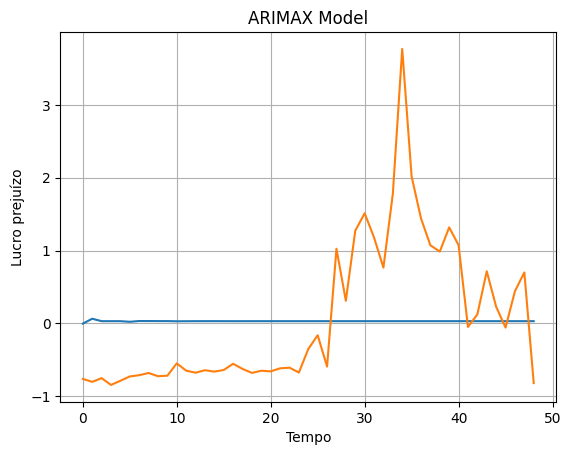

In [ ]:
#Ploting the ARIMAX prediction graph
plt.grid()
plt.title("ARIMAX Model")
plt.ylabel("Lucro prejuízo")
plt.xlabel("Tempo")
plt.plot(y_estimation_arimax)
plt.plot(y_real)

In [ ]:
residual = {}
residuo_arimax_array = []
theta_arimax = {}
y_estimado_armax = {}
psi_arimax = {}

for i,empresa in enumerate(psi_empresas.keys()):
    psi = psi_empresas[empresa]

    psi_arimax[empresa] = psi_empresas[empresa].copy()
    #print(f"{empresa} - {np.shape(psi)}")
    psi_t = np.transpose(psi)
    psi_pseudo_inv = np.linalg.pinv(psi)
    inicio_output = len(dict_empresas[empresa]['Receita de venda']) - len(psi)
    theta_armax[empresa] = np.dot(psi_pseudo_inv, dict_empresas[empresa]['Receita de venda'][inicio_output:])
    y_estimado_armax[empresa] = np.dot(psi, theta[empresa])
    #print(f"{empresa} - Theta = {np.shape(theta)}")
    residual[empresa] = (dict_empresas[empresa]['Receita de venda'][inicio_output:] - np.dot(psi, theta[empresa]))
    mse = np.mean(residual[empresa]**2)
    print(f'{empresa} - MSE: {mse}')
    

eletrobras - MSE: 1.2749521275496155e-28
tpaulista - MSE: 1.470372106486628e-28
taesa - MSE: 0.003314883998876431
alupar - MSE: 0.0017148097628464107


# NARX MODEL - BATCH

Method to add non-linearities (square terms and interaction terms)

In [262]:
theta_narx = {}
y_estimado_narx = {}
psi_nonlinear = {}
X_train_nonlinear = {}
X_val_nonlinear = {}
# Add nonlinearity manually (e.g., square terms, interaction terms)
def add_nonlinear_terms(X):
    # Example: Add square of each term
    squared_features = X**2
    
    # Add interaction terms (each feature multiplied by every other feature)
    interaction_terms = []
    num_features = X.shape[1]
    
    for i in range(num_features):
        for j in range(i+1, num_features):
            interaction_terms.append(X[:, i] * X[:, j])
    
    interaction_terms = np.array(interaction_terms).T  # Transpose to match the shape
    
    # Combine original, squared, and interaction terms
    return np.hstack((X, squared_features, interaction_terms))

TRAINING AND TESTING

PSI_nonlinear shape = (39, 2700)
theta_narx shape = (2700,)
eletrobras - MSE: 7.585656853147454e-32
eletrobras - test MSE: 0.4866837768531568
PSI_nonlinear shape = (39, 2700)
theta_narx shape = (2700,)
tpaulista - MSE: 1.752254368337168e-32
tpaulista - test MSE: 2.7173601282896893
PSI_nonlinear shape = (39, 2700)
theta_narx shape = (2700,)
taesa - MSE: 3.0775499477539335e-30
taesa - test MSE: 5.060589659730886
PSI_nonlinear shape = (39, 2700)
theta_narx shape = (2700,)
alupar - MSE: 7.390911274286996e-32
alupar - test MSE: 2.2524623143196845


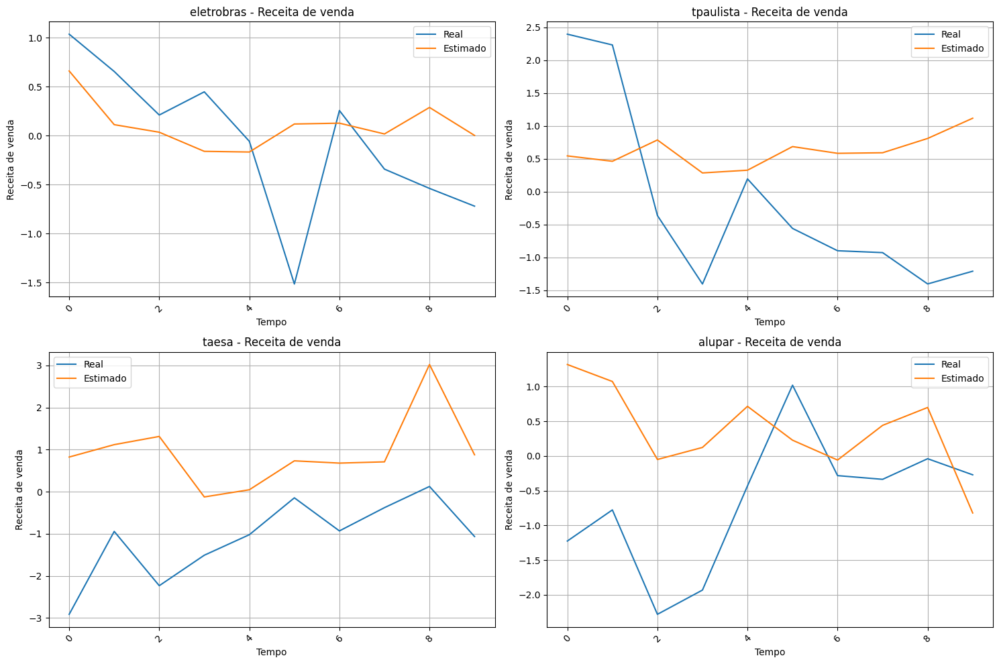

In [272]:
train_proportion = 0.8
fig, axs = plt.subplots(2, 2, figsize=(15, 10))  
for i,empresa in enumerate(psi_empresas.keys()):    
    X = psi_empresas[empresa]
    y = np.array(dict_empresas[empresa]['Receita de venda'][4:])

    train_size = int(len(X) * train_proportion)
    val_index = int(len(X) * (1-train_proportion))

    X_train, X_val = X[:train_size], X[train_size:]
    y_train, y_val = y[:train_size], y[train_size:]
    # Add nonlinear terms (square and interaction terms) to the regressor matrix
    X_train_nonlinear[empresa] = add_nonlinear_terms(X_train)
    print(f"PSI_nonlinear shape = {np.shape(X_train_nonlinear[empresa])}")

    # Solve the regression problem using least squares
    psi_pseudo_inv = np.linalg.pinv(X_train_nonlinear[empresa])
    theta_narx[empresa] = np.dot(psi_pseudo_inv, y_train)
    
    print(f"theta_narx shape = {np.shape(theta_narx[empresa])}")
    y_estimado_narx[empresa] = np.dot(X_train_nonlinear[empresa], theta_narx[empresa])

    mse = np.mean((y_train -  y_estimado_narx[empresa]))**2
    print(f'{empresa} - MSE: {mse}')

    #############################TESTING###################################################################
    X_val_nonlinear[empresa] = add_nonlinear_terms(X_val)
    y_estimado_narx[empresa] = np.dot(X_val_nonlinear[empresa], theta_narx[empresa])
    mse = np.mean((y_val - y_estimado_narx[empresa])**2)
    print(f'{empresa} - test MSE: {mse}')

    ax = axs[i // 2, i % 2]  # Selecting the correspondent subplot
    ax.set_title(f'{empresa} - Receita de venda')
    ax.set_xlabel('Tempo')
    ax.set_ylabel('Receita de venda')
    ax.plot(y_estimado_narx[empresa], label='Real')
    ax.plot(y_val, label='Estimado')
    ax.legend()
    ax.grid()
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

Free run simulation

In [268]:
def free_run_simulation_narx(theta, psi_initial, steps, num_lags, exogenous_vars):
    """
    Free-run simulation for ARX model with exogenous variables and multiple lags.

    Parameters:
    - theta: The pre-existing ARX parameters (first num_lags parameters for y, then for exogenous inputs).
    - psi_initial: The initial regressor (past values of y and exogenous variables).
    - steps: Number of simulation steps to perform.
    - num_lags: Number of lags for the ARX model.
    - exogenous_vars: The fixed exogenous variables over time (remain constant during the free-run simulation).

    Returns:
    - y_estimation: The predicted output values for each step.
    """
    psi_free_run = np.array(psi_initial)  # Convert psi_initial to a numpy array
    y_estimation = []            # List to store the predicted y values

    # Extract the current autoregressive part (only get the first num_lags columns)

    current_psi = psi_free_run[:1, :]
    narx_current_psi = add_nonlinear_terms(current_psi)
    print(f"current_psi={np.shape(current_psi)}")
    y_hat = np.dot(narx_current_psi, theta_narx[empresa])  # Linear combination of theta and psi
    print(f"y_hat={np.shape(y_hat)}")

    # Append the estimated value to the list
    y_estimation.append(y_hat)
    print(y_estimation)

    psi_ar_part = psi_free_run[:, :num_lags]

    # Loop for the number of simulation steps
    for t in range(steps):
        print(t)
        
        if t == 0:
            continue
        
        print(f"{empresa} - Start Step {t+1} ********************************************")
        #Updating the autoregressive part whith the new estimated value
        psi_lag_4 = np.insert(psi_ar_part[:,0], 1, psi_ar_part[:,1].copy()[-1], axis=0)
        psi_lag_3 = np.insert(psi_ar_part[:,1], 1, psi_ar_part[:,2].copy()[-1], axis=0)
        psi_lag_2 = np.insert(psi_ar_part[:,2], 1, psi_ar_part[:,3].copy()[-1], axis=0)
        psi_lag_1 = np.insert(psi_ar_part[:,3], 1, y_estimation[-1])
        print(f"psi_lag shape = {np.shape(psi_lag_1)}")

         # Transformar os arrays em colunas de uma matriz
        psi_ar_part = np.column_stack((psi_lag_4, psi_lag_3, psi_lag_2, psi_lag_1))

        # Combine the autoregressive part with the fixed exogenous variables
        current_psi = np.column_stack((psi_ar_part, exogenous_vars[:t+1]))
        print(f"current_psi={np.shape(current_psi)}")
        
        #Adding nonlinear terms
        narx_current_psi = add_nonlinear_terms(current_psi)


        # Estimate y using the current psi and theta
        y_estimation = np.dot(narx_current_psi, theta_narx[empresa])  # Linear combination of theta and psi
        print(10*'*')
        print(f"Estimation shape={np.shape(y_estimation)}")

        # Update psi: Shift the autoregressive part and append the new y_hat
        print(f"Current psi {np.shape(narx_current_psi)}")
        print(f"End Step {t+1} - y_hat: {y_estimation[-1]}")
    

    return np.array(y_estimation)


In [269]:
#Function implementation
y_simulation_narx = {}
for empresa in psi_empresas.keys():
    num_lags = 4                                          # 4 lags in the model
    psi_initial = psi_empresas[empresa][:1]               # Initial regressor (first row of psi matrix)
    exogenous_vars = psi_empresas[empresa][:,4:]          # Exogenous variables (remain constant) 
    print(exogenous_vars.shape)                           # Exogenous variables remain constant
    steps = len(psi_empresas[empresa]) - 1         # Number of steps for simulation
                    
    # Perform the free-run simulation
    y_simulation_narx[empresa] = free_run_simulation_narx(theta_armax[empresa], psi_initial, steps, num_lags, exogenous_vars)

(49, 68)
current_psi=(1, 72)
y_hat=(1,)
[array([0.13324805])]
0
1
eletrobras - Start Step 2 ********************************************
psi_lag shape = (2,)
current_psi=(2, 72)
**********
Estimation shape=(2,)
Current psi (2, 2700)
End Step 2 - y_hat: 0.07193160411116331
2
eletrobras - Start Step 3 ********************************************
psi_lag shape = (3,)
current_psi=(3, 72)
**********
Estimation shape=(3,)
Current psi (3, 2700)
End Step 3 - y_hat: 0.22729560410789484
3
eletrobras - Start Step 4 ********************************************
psi_lag shape = (4,)
current_psi=(4, 72)
**********
Estimation shape=(4,)
Current psi (4, 2700)
End Step 4 - y_hat: 0.6106626342428242
4
eletrobras - Start Step 5 ********************************************
psi_lag shape = (5,)
current_psi=(5, 72)
**********
Estimation shape=(5,)
Current psi (5, 2700)
End Step 5 - y_hat: -0.49368764901676393
5
eletrobras - Start Step 6 ********************************************
psi_lag shape = (6,)
curren

************** Company: eletrobras **************
MSE Free Run 0.1264109734504612
RMSE Free Run 0.35554320897812297
************** Company: tpaulista **************
MSE Free Run 0.42442760636777727
RMSE Free Run 0.651481086730672
************** Company: taesa **************
MSE Free Run 0.7607357842882583
RMSE Free Run 0.8722016878499251
************** Company: alupar **************
MSE Free Run 0.37430408794552306
RMSE Free Run 0.6118039620217599


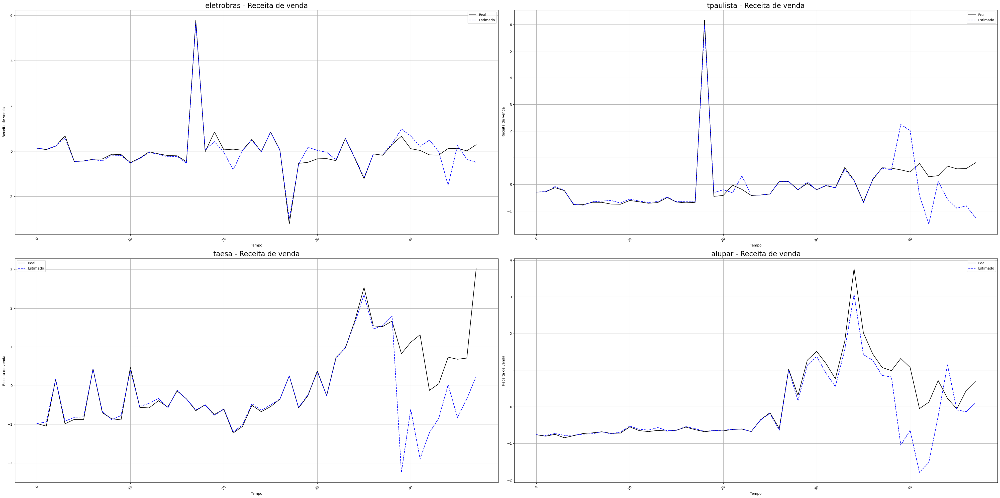

In [273]:
# Plotar os resultados
plot_company_sales(psi_empresas, dict_empresas, y_simulation_narx)

Ploting residual

************** Company: eletrobras **************
Residual mean =  0.02042686379771494
Residual variance =  2.1592251307525507
Residual skewness =  0.29175755157956934
************** Company: tpaulista **************
Residual mean =  0.13998982546745922
Residual variance =  2.3131452254570495
Residual skewness =  0.16500879815166597
************** Company: taesa **************
Residual mean =  0.3618950838931722
Residual variance =  0.9477179883336827
Residual skewness =  1.1037458729463479
************** Company: alupar **************
Residual mean =  0.23721887924887927
Residual variance =  0.5683527867861368
Residual skewness =  1.151117549680199


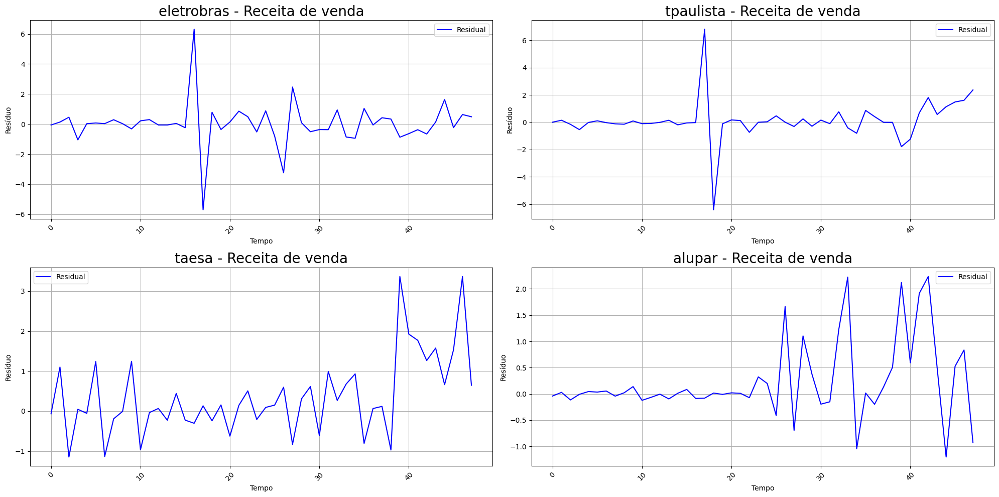

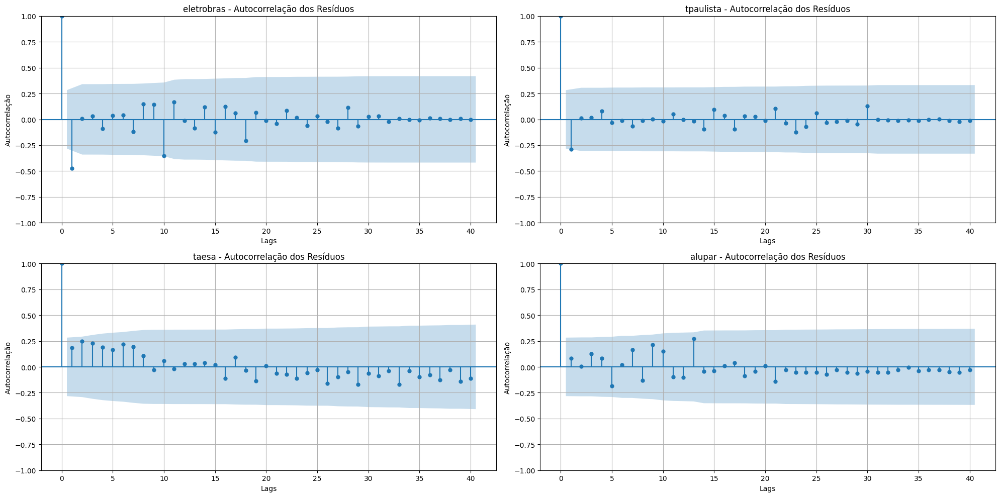

In [276]:
ploting_residual(y_simulation_narx, dict_empresas)

# NARX MODEL - BATCH - CROSS VALIDATION

In [277]:
import numpy as np
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import TimeSeriesSplit

# Define the number of splits
n_splits = 4
tscv = TimeSeriesSplit(n_splits=n_splits)

# Initialize dictionaries to store results
theta_narx = {}
y_estimado_narx = {}
mse_scores = {}
theta_narx_cross = {}


for empresa in psi_empresas.keys():
    # Extract the input and output data
    X = psi_empresas[empresa]
    y = dict_empresas[empresa]['Receita de venda']
    
    # Initialize lists to store fold results
    fold_mse_scores = []
    
    i=0
    # Perform TimeSeriesSplit cross-validation
    for train_index, val_index in tscv.split(X):
        i = i + 1
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]
        
        # Add nonlinear terms (square and interaction terms) to the regressor matrix
        psi_nonlinear_train = add_nonlinear_terms(X_train)
        psi_nonlinear_val = add_nonlinear_terms(X_val)
        
        # Solve the regression problem using least squares
        psi_pseudo_inv = np.linalg.pinv(psi_nonlinear_train)
        theta_narx_cross[empresa] = np.dot(psi_pseudo_inv, y_train)
        print(f"{theta_narx_cross[empresa][:3]}")
        
        # Predict on the validation set
        y_pred = np.dot(psi_nonlinear_val, theta_narx_cross[empresa])
        
        # Calculate MSE for the current fold
        mse = np.mean((y_val - y_pred) ** 2)
        fold_mse_scores.append(mse)

        print(f"{empresa} - Split {i} - MSE = {mse}")
        # plt.figure(figsize=(10, 5))
        # plt.plot(y_val, label='Real')
        # plt.plot(y_pred, label='Estimado NARX')
        # plt.title(f'{empresa} - Previsão NARX')
        # plt.xlabel('Tempo')
        # plt.ylabel('Receita de venda')
        # plt.legend()
        # plt.grid()
        # plt.show()
    
    # Store the average MSE for the current company
    mse_scores[empresa] = np.mean(fold_mse_scores)
    
    # Train the final model on the entire dataset
    psi_nonlinear[empresa] = add_nonlinear_terms(X)
    psi_pseudo_inv = np.linalg.pinv(psi_nonlinear[empresa])
    theta_narx[empresa] = np.dot(psi_pseudo_inv, y[4:])
    y_estimado_narx[empresa] = np.dot(psi_nonlinear[empresa], theta_narx[empresa])
    
    # Print the results
    print(f"************** Company: {empresa} **************")
    print(f"Average MSE (Cross-Validation): {mse_scores[empresa]}")
    print(f"Final Model Coefficients:\n{theta_narx[empresa]}")
    print(f"Predicted values:\n{y_estimado_narx[empresa]}")

C:\Users\giova\AppData\Local\Temp\ipykernel_13372\3750448519.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train, y_val = y[train_index], y[val_index]


[0.00672531 0.00171714 0.00048661]
eletrobras - Split 1 - MSE = 3.421686624411129
[0.00853341 0.00160722 0.00056188]
eletrobras - Split 2 - MSE = 0.1383974960473256
[0.00997534 0.00157546 0.00118773]
eletrobras - Split 3 - MSE = 1.9698799196893413
[0.01241547 0.00211938 0.0012917 ]
eletrobras - Split 4 - MSE = 0.16460835454581935
************** Company: eletrobras **************
Average MSE (Cross-Validation): 1.4236430986734039
Final Model Coefficients:
[-4.31365553e-04  9.22804156e-04 -4.48147494e-03 ...  9.49680160e-05
  3.35678377e-04 -1.11552316e-03]
Predicted values:
[ 1.33248052e-01  7.19316041e-02  2.24473792e-01  6.85860550e-01
 -4.53167040e-01 -4.30517141e-01 -3.54903275e-01 -3.39453216e-01
 -1.34096538e-01 -1.47305855e-01 -5.03124847e-01 -3.05111792e-01
 -2.62061734e-02 -1.14474155e-01 -1.91460369e-01 -2.01350333e-01
 -4.62185526e-01  5.78359348e+00 -2.40608131e-02  8.50579473e-01
  6.15685316e-02  9.13010615e-02  4.34238419e-02  5.24685672e-01
 -2.77011872e-02  8.49213295e-

L1 Regularization

In [286]:
import numpy as np
from sklearn.model_selection import TimeSeriesSplit
from sklearn.linear_model import Lasso

# Define the number of splits
n_splits = 4
tscv = TimeSeriesSplit(n_splits=n_splits)

# Initialize dictionaries to store results
theta_narx_lasso = {}
y_estimado_narx = {}
mse_scores = {}
theta_narx_cross = {}

# Define the regularization parameter (alpha)
alpha = 0.1

for empresa in psi_empresas.keys():
    # Extract the input and output data
    X = psi_empresas[empresa]
    y = dict_empresas[empresa]['Receita de venda']
    
    # Initialize lists to store fold results
    fold_mse_scores = []
    
    i = 0
    # Perform TimeSeriesSplit cross-validation
    for train_index, val_index in tscv.split(X):
        i += 1
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        # Add nonlinear terms (square and interaction terms) to the regressor matrix
        psi_nonlinear_train = add_nonlinear_terms(X_train)
        psi_nonlinear_val = add_nonlinear_terms(X_val)
        
        # Solve the regression problem using Lasso (L1 regularization)
        lasso = Lasso(alpha=alpha)
        lasso.fit(psi_nonlinear_train, y_train)
        theta_narx_cross[empresa] = lasso.coef_
        print(f"{theta_narx_cross[empresa][:3]}")
        
        # Predict on the validation set
        y_pred = lasso.predict(psi_nonlinear_val)
        
        # Calculate MSE for the current fold
        mse = np.mean((y_val - y_pred) ** 2)
        fold_mse_scores.append(mse)

        print(f"{empresa} - Split {i} - MSE = {mse}")
        # plt.figure(figsize=(10, 5))
        # plt.plot(y_val, label='Real')
        # plt.plot(y_pred, label='Estimado NARX')
        # plt.title(f'{empresa} - Previsão NARX')
        # plt.xlabel('Tempo')
        # plt.ylabel('Receita de venda')
        # plt.legend()
        # plt.grid()
        # plt.show()
    
    # Store the average MSE for the current company
    mse_scores[empresa] = np.mean(fold_mse_scores)
    
    # Train the final model on the entire dataset
    psi_nonlinear[empresa] = add_nonlinear_terms(X)
    lasso_final = Lasso(alpha=alpha)
    lasso_final.fit(psi_nonlinear[empresa], y[4:])
    theta_narx_lasso[empresa] = lasso_final.coef_
    print(f"theta shape = {len(theta_narx_lasso[empresa]) - np.sum(theta_narx_lasso[empresa] == 0)}")
    y_estimado_narx[empresa] = lasso_final.predict(psi_nonlinear[empresa])
    mse_final = np.mean(y[4:] - y_estimado_narx[empresa])
    
    # Print the results
    print(f"************** Company: {empresa} **************")
    print(f"Average MSE (Cross-Validation): {mse_scores[empresa]}")
    print(f"MSE final: {mse_final}")
    print(f"Final Model Coefficients:\n{theta_narx[empresa]}")
    print(f"Predicted values:\n{y_estimado_narx[empresa]}")

[0. 0. 0.]
eletrobras - Split 1 - MSE = 3.9298380840549907
[ 0.  0. -0.]
eletrobras - Split 2 - MSE = 0.2629279036702019
[ 0.02139965  0.         -0.        ]
eletrobras - Split 3 - MSE = 2.870123948917682
[ 0.39571354 -0.         -0.        ]
eletrobras - Split 4 - MSE = 0.07441850327864327
theta shape = 24
************** Company: eletrobras **************
Average MSE (Cross-Validation): 1.7843271099803797
MSE final: -4.7580986769649563e-17
Final Model Coefficients:
[-4.31365553e-04  9.22804156e-04 -4.48147494e-03 ...  9.49680160e-05
  3.35678377e-04 -1.11552316e-03]
Predicted values:
[-0.03922601 -0.10983955  0.19549602  0.23249387 -0.3853656   0.00819682
 -0.1942296  -0.25776859 -0.28379402  0.42391362 -0.36632917 -0.1984773
 -0.41484387 -0.20920524 -0.50249187 -0.07965792  0.25418177  4.53073124
 -0.08506076  0.89304082 -0.03595637  0.21405191 -0.13776937  0.35046567
 -0.0381491   0.37463737  0.09570167 -1.12116673 -0.51755164 -0.63430397
 -0.33741686 -0.30796074 -0.29907928  0.411

In [287]:
lasso.sparse_coef_

<1x2700 sparse matrix of type '<class 'numpy.float64'>'
	with 18 stored elements in Compressed Sparse Row format>

In [290]:
#Free run function implementation
y_estimado_narx_lasso = {}
for empresa in psi_empresas.keys():
    num_lags = 4                                          # 4 lags in the model
    psi_initial = psi_empresas[empresa][:1]               # Initial regressor (first row of psi matrix)
    exogenous_vars = psi_empresas[empresa][:,4:]          # Exogenous variables (remain constant) 
    print(exogenous_vars.shape)                           # Exogenous variables remain constant
    steps = len(psi_empresas[empresa]) - 1         # Number of steps for simulation
    # Perform the free-run simulation
    y_estimado_narx_lasso[empresa] = free_run_simulation_narx(theta_narx_lasso[empresa], psi_initial, steps, num_lags, exogenous_vars)

(49, 68)
current_psi=(1, 72)
y_hat=(1,)
[array([0.13324805])]
0
1
eletrobras - Start Step 2 ********************************************
psi_lag shape = (2,)
current_psi=(2, 72)
**********
Estimation shape=(2,)
Current psi (2, 2700)
End Step 2 - y_hat: 0.07193160411116739
2
eletrobras - Start Step 3 ********************************************
psi_lag shape = (3,)
current_psi=(3, 72)
**********
Estimation shape=(3,)
Current psi (3, 2700)
End Step 3 - y_hat: 0.22741754488267582
3
eletrobras - Start Step 4 ********************************************
psi_lag shape = (4,)
current_psi=(4, 72)
**********
Estimation shape=(4,)
Current psi (4, 2700)
End Step 4 - y_hat: 0.6120481454687687
4
eletrobras - Start Step 5 ********************************************
psi_lag shape = (5,)
current_psi=(5, 72)
**********
Estimation shape=(5,)
Current psi (5, 2700)
End Step 5 - y_hat: -0.49605221241384045
5
eletrobras - Start Step 6 ********************************************
psi_lag shape = (6,)
curren

************** Company: eletrobras **************
MSE Free Run 0.04052360538790296
RMSE Free Run 0.20130475748949142
************** Company: tpaulista **************
MSE Free Run 0.013261778503963826
RMSE Free Run 0.11515979551893893
************** Company: taesa **************
MSE Free Run 0.010649547688767344
RMSE Free Run 0.1031966457244001
************** Company: alupar **************
MSE Free Run 0.02653626839111972
RMSE Free Run 0.16289956534969552


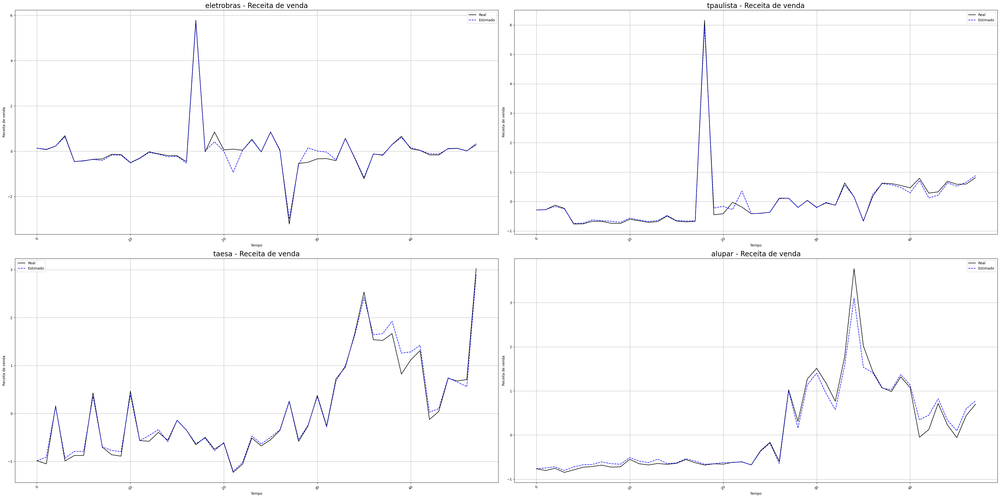

In [291]:
plot_company_sales(psi_empresas, dict_empresas, y_estimado_narx_lasso)

MSE = 0.17871843466568696


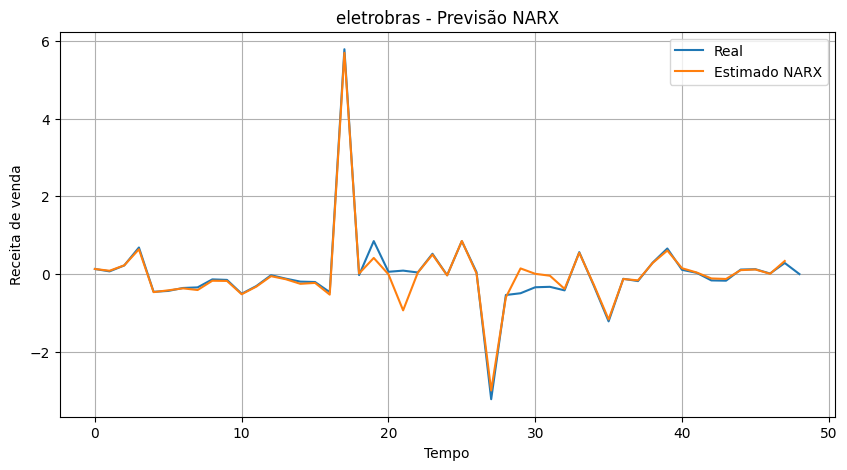

MSE = 0.17195993741458535


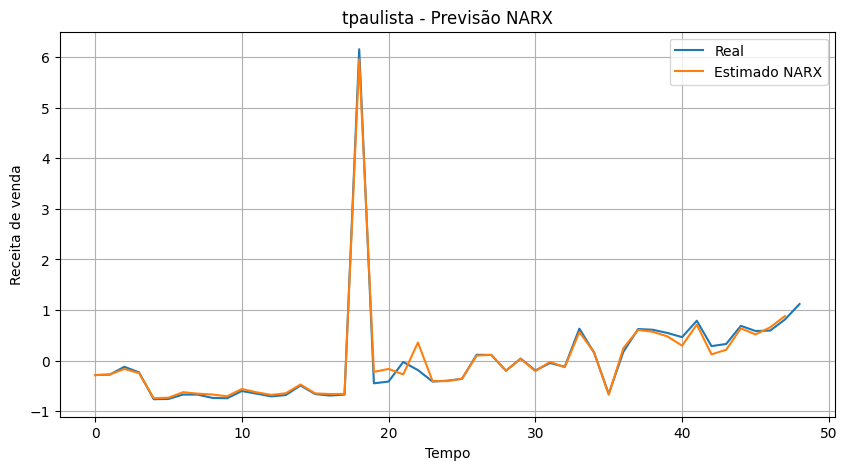

MSE = 0.10725322249150737


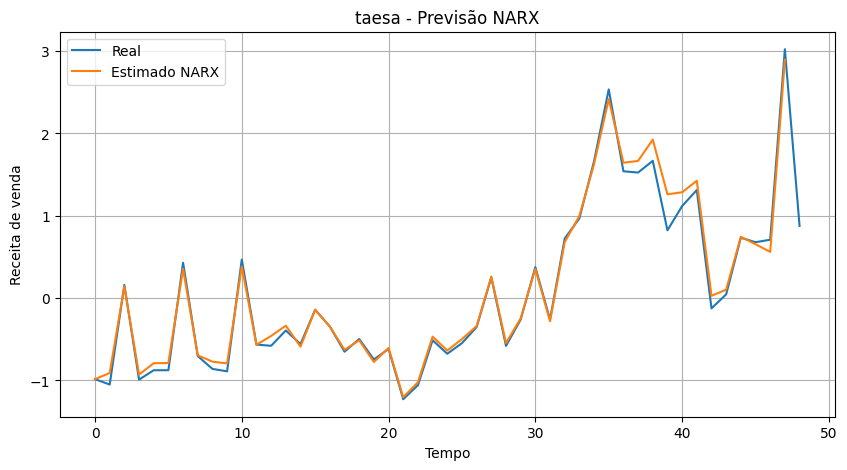

MSE = 0.08751144627665532


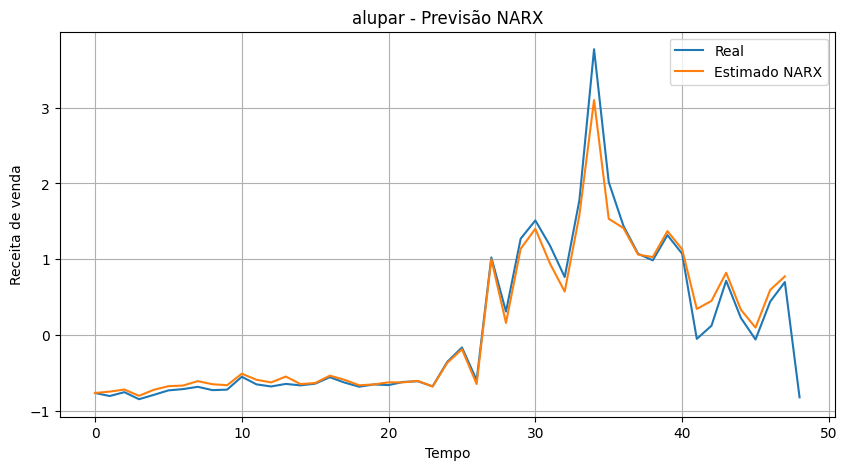

In [281]:
import matplotlib.pyplot as plt

# Ploting the predicted values
for empresa in psi_empresas.keys():
    y_real = np.array(dict_empresas[empresa]['Receita de venda'][4:])
    mse = np.mean((y_real - y_estimado_narx[empresa])**2)
    print(f"MSE = {mse}")
    # Plotando os resultados do modelo NARX
    plt.figure(figsize=(10, 5))
    plt.plot(y_real, label='Real')
    plt.plot(y_estimado_narx_fr[empresa], label='Estimado NARX')
    plt.title(f'{empresa} - Previsão NARX')
    plt.xlabel('Tempo')
    plt.ylabel('Receita de venda')
    plt.legend()
    plt.grid()
    plt.show()
    

Analysing the coefficients

In [ ]:
theta_narx['taesa']

array([0.0115132 , 0.01233084, 0.01283622, ..., 0.00115898, 0.00322937,
       0.00495701])

In [ ]:
theta_narx_lasso['taesa']

array([0., 0., 0., ..., 0., 0., 0.])